# **Notebook for producing plots of frequency of turbulence indices over 99th percentile**

Makes:
1. Timeseries plots
     - Frequency per 6 hour (%)
     - % change in frequency per 6 hours
1. Future scenarios spatial plots
     - 3 + 1 scenario plots using only model data --> preps pkls of data to go into the plots, then plots (only run pkls once)

In [1]:
# IMPORTS:

import os, sys
sys.path.insert(0, os.path.dirname(os.getcwd())) 
import glob
import importlib
import pickle
import gc

import xarray as xr
import numpy as np
from xarray.groupers import SeasonResampler, SeasonGrouper
import os

from IPython.display import display
from matplotlib import colors, cm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import turbulence_AUSCAT.auscat_plots as auscat_plots
from turbulence_AUSCAT.cat_evaluation import combined_significance_table, time_sel_dict, calc_trend_table, select_resample_time
# combined_significance_table is very slow and not at all parallelised. Need to be smarter so it can be run on dask

import datetime
import calendar

from scipy import stats
import math

import dask
from dask.distributed import Client
from dask.diagnostics import ProgressBar
from tqdm.notebook import tqdm
# request 14 cores 64GB


# Setup:

In [2]:
# Set time of study:

baseline_time_range = np.arange(1990,2009+1)
baseline_time_slice = slice("1990", "2009")

time_slices = [("2015", "2034"), 
              ("2040", "2059"),
              ("2080", "2099")]


In [3]:
'''
ssp_colors = {"evaluation":"k",
               "historical":"grey",
               "ssp585":(149/255,27/255,30/255),
               "ssp370":(231/255,29/255,37/255),
               "ssp245":(247/255,148/255,32/255),
               "ssp126":(23/255,60/255,102/255),
               "ssp119":(0/255,173/255,207/255),}
'''

'\nssp_colors = {"evaluation":"k",\n               "historical":"grey",\n               "ssp585":(149/255,27/255,30/255),\n               "ssp370":(231/255,29/255,37/255),\n               "ssp245":(247/255,148/255,32/255),\n               "ssp126":(23/255,60/255,102/255),\n               "ssp119":(0/255,173/255,207/255),}\n'

In [3]:
# List of model outputs for use:

list_evaluation = ['evaluation_BARRA-R_r1i1p1f1',
                  ]

list_historical = ['historical_ACCESS-CM2_r4i1p1f1', 
                   'historical_ACCESS-ESM1-5_r6i1p1f1',
                   'historical_CESM2_r11i1p1f1', 
                   'historical_CMCC-ESM2_r1i1p1f1',
                   'historical_EC-Earth3_r1i1p1f1',
                   'historical_MPI-ESM1-2-HR_r1i1p1f1',
                   'historical_NorESM2-MM_r1i1p1f1',
                  ]

list_ssp126 = [
                 'ssp126_ACCESS-CM2_r4i1p1f1',
                 'ssp126_ACCESS-ESM1-5_r6i1p1f1',
                 'ssp126_CESM2_r11i1p1f1',
                 'ssp126_CMCC-ESM2_r1i1p1f1',
                 'ssp126_EC-Earth3_r1i1p1f1',
                 'ssp126_MPI-ESM1-2-HR_r1i1p1f1',
                 'ssp126_NorESM2-MM_r1i1p1f1',
              ]

list_ssp370 = ['ssp370_ACCESS-CM2_r4i1p1f1',
                 'ssp370_ACCESS-ESM1-5_r6i1p1f1',
                 'ssp370_CESM2_r11i1p1f1',
                 'ssp370_CMCC-ESM2_r1i1p1f1',
                 'ssp370_EC-Earth3_r1i1p1f1',
                 'ssp370_MPI-ESM1-2-HR_r1i1p1f1',
                 'ssp370_NorESM2-MM_r1i1p1f1',
              ]

list_ssp585 = ['ssp585_ACCESS-CM2_r4i1p1f1',
                 'ssp585_EC-Earth3_r1i1p1f1']

list_future = list_ssp126 + list_ssp370 + list_ssp585

# Master function from Gen:

(Not working)

In [16]:
#importlib.reload(auscat_plots)

def run_all_plots_and_tables(turbulence_index, P, window_size = 10, time_slices=time_slices):
    """ Function for all the plots and tables for specified turbulence index and pressure level P.
    window specifies the rolling window for time series plots. Time slices specifies the list of 
    (three) start/end year slices for plot_futures futre decades plots"""
    
    #  ------------------  make evaluation table ----------------------------
    # Evaluate the models compared to BARRA-R for a baseline period of 1990 to 2009
    
    path=f"/scratch/v46/ls7238/CAT_turbulence"
    outfile = f"{path}/{turbulence_index}/{P}hPa/evaluation_combined_tests_table_{turbulence_index}-{P}hPa.csv"
    
    if  os.path.exists(outfile):
        print(f"File '{outfile}' already exists.")
    else:
        combined_significance_table(turbulence_index, P, path=path)

    # ----------------- evaluate baseline period ------------------------------
    filelist = glob(f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/freq-above-p99/{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_*.nc")
    ds = xr.open_mfdataset(filelist, 
                           combine="nested",
                           concat_dim="run",
                           join='outer', 
                           coords='different',
                          compat='no_conflicts')
    ds = ds.assign_coords({"pressure":[P]})

    # --------------------------- Baseline maps per model -----------------
    ds_baseline_mapped = ds.isel({'pressure':0}).sel({"time":baseline_time_slice, 
                                                          # "lat":mid_lat_slice,
                                                          "lon": lon_slice}).resample({"time":"YE"}).mean()

    
    auscat_plots.evaluate_model_map(ds_baseline_mapped, turbulence_index, P)
    auscat_plots.evaluate_model_map_anom(ds_baseline_mapped, turbulence_index, P)

    # ----------------------- Dataset time series ------------------
    # weighted for latitudes
    weights = np.cos(np.deg2rad(ds[turbulence_index].lat))
    weights.name = "weights"
    
    ds_ts  = ds.sel({"lat":mid_lat_slice, 
                     "lon": lon_slice,
                     "run":list_evaluation+list_historical+list_future
                    }).weighted(weights).mean(["lat", "lon"]).load()

    # ----------------------- calculate table
    outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Trend_table_{turbulence_index}_{P}hPa_Frequency_of_exceeding_p99.csv" 
    
    if  os.path.exists(outfile):
        print(f"File '{outfile}' already exists.")
    else:
        calc_trend_table(ds_ts, turbulence_index, P, outfile=outfile,)

    
    # ------------------------ Time series plots
    # "turbulence_index": [annual max, seasonal max, monthly max]
    ymax_dict = {"windspeed": [0.05, 0.08, 0.12],
                 "VWS": [0.022, 0.24, 0.24],
                 "TI1": [0.014, 0.025, 0.025],
                }

    auscat_plots.plot_timeseries_annual(ds_ts, turbulence_index, P, window_size, ymax=0.014)
    auscat_plots.plot_timeseries_annual(ds_ts, turbulence_index, P, window_size=1, ymax=0.018)
    auscat_plots.plot_timeseries_coolwarmseason(ds_ts, turbulence_index, P, window_size, ymax=[0.018, 0.010])   
    auscat_plots.plot_timeseries_season(ds_ts, turbulence_index, P, window_size, ymax=[0.01, 0.015, 0.03, 0.012])
    auscat_plots.plot_timeseries_month(ds_ts, turbulence_index, P, window_size, ymax=[0.01, 0.01, 0.012, 
                                                                                      0.011, 0.015, 0.03, 
                                                                                      0.035, 0.03, 0.017, 
                                                                                      0.01, 0.01, 0.01]
                                        )
    

    # ----------------------  maps
    evaluation = list_evaluation[0]
    filelist = [f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/freq-above-p99/{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_{run}_BOM_BARPA-R_v1-r1_6hr.nc" 
                            for run in [evaluation] + list_historical]
    ds = xr.open_mfdataset(filelist,
                          concat_dim="run",
                          combine="nested",
                          join="outer",
                          coords='different',
                          compat='no_conflicts').sel({"lon":lon_slice, "time": baseline_time_slice})
    
    ds_hist = ds.sel({"run":list_historical})
    ds_eval=ds.sel({"run":evaluation}).load()

    # ------------ baseline climatology
    auscat_plots.plot_baseline_ann(ds_eval, turbulence_index, P, ticks_max=0.07)   
    auscat_plots.plot_baseline_coolwarmseason(ds_eval, turbulence_index, P,ticks_max=0.07)
    auscat_plots.plot_baseline_season(ds_eval, turbulence_index, P,ticks_max=0.07)
    auscat_plots.plot_baseline_months(ds_eval, turbulence_index, P,ticks_max=0.07)
    del ds_eval
    # ------------- future maps
    plt.close()
    
    for time_selection in ["MJJASO", "annual",]:
        for experiment in ["ssp126", "ssp370", "ssp585"]:
            plt.close('all')
            if experiment == "ssp585":
                # because there are only two
                all_agree_except = 0
            else:
                all_agree_except = 1
            outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_3timeslices.png"
            if  os.path.exists(outfile):
                print(f"File '{outfile}' already exists.")
                continue
            try:
                auscat_plots.plot_futures(time_selection=time_selection, 
                             turbulence_index=turbulence_index,
                             time_slices=time_slices,
                             experiment=experiment, 
                             all_agree_except=all_agree_except, 
                             save_fig=True,
                             outfile = outfile,
                             zonal_plots=True,
                             ticks_max=0.02,
                             P=P
                                )                  
            except:
                print(f"problem making '{outfile}'.")
                
            # plot_futures(time_selection=time_selection, 
            #              turbulence_index=turbulence_index,
            #              time_slices=time_slices,
            #              experiment=experiment, 
            #              all_agree_except=all_agree_except, 
            #              save_fig=True,
            #              outfile = outfile,
            #              zonal_plots=True,
            #              ticks_max=0.02,
            #              P=P
            #                 )


            try:
                outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_baseline-plus-3timeslices.png"
                auscat_plots.plot_futures_1plus3(time_selection=time_selection, 
                                    turbulence_index=turbulence_index,
                                    P=P,
                                    time_slices=[("1990", "2009")] + time_slices,
                                    experiment=experiment, 
                                    all_agree_except=all_agree_except, 
                                    save_fig=True,
                                    outfile = outfile,
                                    ticks_max=0.02,
                                    )
            except:
                print(f"problem making '{outfile}'.")
            plt.close("all")


    return

In [19]:
# Run master function

with Client(threads_per_worker=5, n_workers=3) as client: 
    retry_count = 0
    while retry_count <20:
        try:
            for turbulence_index in ["VWS", "TI1","windspeed"]:
                run_all_plots_and_tables(turbulence_index, P = 250, window_size = 10)
                plt.close('all')
        except:
            print(f"retry count = {retry_count}")
            retry_count +=1
            continue

File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 0
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 1
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 2
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 3
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 4
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 5
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_tests_table_VWS-250hPa.csv' already exists.
retry count = 6
File '/scratch/v46/ls7238/CAT_turbulence/VWS/250hPa/evaluation_combined_test

# Individual plots which master function calls all together:

## Setup:

In [4]:
# Choose turbulence index, pressure level, and lat/lon bounding:

turbulence_index = "TI2"      # Options: ['VWS', 'windspeed' 'TI1', 'TI2']
                                    # or: AbsVort(Not fully run) or Ri - only at 250hPa
p99 = 'mmm-p99'         # options: mmm-p99 or BARRA-p99

P=250                       # Stick to 250 as 200 may not be as reliable!!

box = "midlats"
lat_slice = slice(-50, -25)            # Options: 
                                      # just mid-lat band: slice(-50, -25)
                                      # extended lat to top aus: slice(-50,-10)
lon_slice = slice(90, 195)            # Options:
                                      # full width of figure: slice(90, 195)
                                      # reduced to just aus: slice(90, 155) 

# path for model files:
path_stem = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/{p99}"

In [ ]:
# NOT WORKING

# make evaluation table
# Evaluate the models compared to BARRA-R for a baseline period of 1990 to 2009
from turbulence_AUSCAT.cat_evaluation import combined_significance_table

path=f"/scratch/v46/ls7238/CAT_turbulence"
outfile = f"{path}/{turbulence_index}/{P}hPa/evaluation_combined_tests_table_{turbulence_index}-{P}hPa.csv"

if  os.path.exists(outfile):
    print(f"File '{outfile}' already exists.")
else:
    with Client(threads_per_worker=4, n_workers=1) as client:
        combined_significance_table(turbulence_index, P, path=path)

KeyboardInterrupt: 

In [5]:
# Load model ds:

filelist = glob.glob(f"{path_stem}/freq-above-p99/{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_*.nc")
ds = xr.open_mfdataset(filelist, 
                       combine="nested",
                       concat_dim="run",
                       join='outer', 
                       coords='different',
                      compat='no_conflicts')
ds = ds.assign_coords({"pressure":[P]})



# And eval ds:

barra_path = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/BARRA-p99"
eval_files = glob.glob(f"{barra_path}/freq-above-p99/"
                       f"{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_evaluation_*_BOM_BARPA-R_v1-r1_6hr.nc")

ds_eval = xr.open_mfdataset(eval_files, 
                            combine="nested", 
                            concat_dim="run",
                            join="outer", 
                            coords="different", 
                            compat="no_conflicts")

In [7]:
ds

<xarray.Dataset> Size: 95GB
Dimensions:   (run: 24, time: 1464, lat: 436, lon: 777, pressure: 1)
Coordinates:
  * lon       (lon) float64 6kB 88.04 88.19 88.34 88.5 ... 207.6 207.8 207.9
  * lat       (lat) float64 3kB -53.58 -53.42 -53.27 ... 13.32 13.48 13.63
  * time      (time) datetime64[ns] 12kB 1979-01-31 1979-02-28 ... 2100-12-31
  * run       (run) <U33 3kB 'ssp126_MPI-ESM1-2-HR_r1i1p1f1' ... 'evaluation_...
  * pressure  (pressure) int64 8B 250
Data variables:
    Ri        (run, time, lat, lon) float64 95GB dask.array<chunksize=(1, 240, 436, 777), meta=np.ndarray>
Attributes: (12/65)
    axiom_version:             0.1.0
    axiom_schemas_version:     0.1.0
    axiom_schema:              cordex-6H.json
    productive_version:        68ea333
    Conventions:               CF-1.11, ACDD-1.3
    activity_id:               DD
    ...                        ...
    geospatial_lon_max:        207.9275
    history:                   Fri Jun 07 12:42:03 2024: /g/data/access/ngm/m...
    turbulence_index:          Ri
    pressure_level:            250
    Description:               Frequency of Ri at 250hPa above the 99th perce...
    p99:                       1.152088

In [6]:
ds_eval

<xarray.Dataset> Size: 650MB
Dimensions:  (run: 1, time: 240, lat: 436, lon: 777)
Coordinates:
  * lon      (lon) float64 6kB 88.04 88.19 88.34 88.5 ... 207.6 207.8 207.9
  * lat      (lat) float64 3kB -53.58 -53.42 -53.27 -53.11 ... 13.32 13.48 13.63
  * time     (time) datetime64[ns] 2kB 1990-01-31 1990-02-28 ... 2009-12-31
  * run      (run) <U27 108B 'evaluation_BARRA-R_r1i1p1f1'
Data variables:
    TI2      (run, time, lat, lon) float64 650MB dask.array<chunksize=(1, 240, 436, 777), meta=np.ndarray>
Attributes:
    regrid_method:     bilinear
    turbulence_index:  TI2
    pressure_level:    250
    Description:       Frequency of TI2 at 250hPa above the 99th percentile f...
    p99:               2.847791621740251e-07

## Time series plots

### Set-up:

In [7]:
%%time
# Calc the timeseries ds:

# weighted for latitudes
weights = np.cos(np.deg2rad(ds[turbulence_index].lat))
weights.name = "weights"

# Set size of rolling mean window:
window_size = 10

# compile:

# models
with ProgressBar():
    ds_ts_models  = ds.sel({"lat": lat_slice, "lon": lon_slice, "run":list_historical+list_future}).weighted(weights).mean(["lat", "lon"]).load()

# barra
with ProgressBar():
    ds_ts_eval = (ds_eval.sel(lat=lat_slice, lon=lon_slice).weighted(weights).mean(["lat", "lon"]).load())

# Prepend eval run to the existing timeseries dataset
ds_ts = xr.concat([ds_ts_eval, ds_ts_models], dim="run")

ds_ts

[########################################] | 100% Completed | 94.37 s
[########################################] | 100% Completed | 6.08 ss
CPU times: user 1min 17s, sys: 2min 14s, total: 3min 32s
Wall time: 1min 40s


<xarray.Dataset> Size: 296kB
Dimensions:  (run: 24, time: 1464)
Coordinates:
  * time     (time) datetime64[ns] 12kB 1979-01-31 1979-02-28 ... 2100-12-31
  * run      (run) <U33 3kB 'evaluation_BARRA-R_r1i1p1f1' ... 'ssp585_EC-Eart...
Data variables:
    TI2      (run, time) float64 281kB nan nan nan ... 0.01527 0.006346 0.006851

In [8]:
# Calculate table of outputs

outfile = f"{path_stem}/Trend_table_{turbulence_index}_{P}hPa_Frequency_of_exceeding_{p99}.csv" 

if  os.path.exists(outfile):
    print(f"File '{outfile}' already exists.")
else:
    calc_trend_table(ds_ts, turbulence_index, P, outfile=outfile,)


KeyboardInterrupt: 

### Frequency per 6h

using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Timeseries_p99freq_TI2_250hPa_midlats_annual_rolling10.png
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']


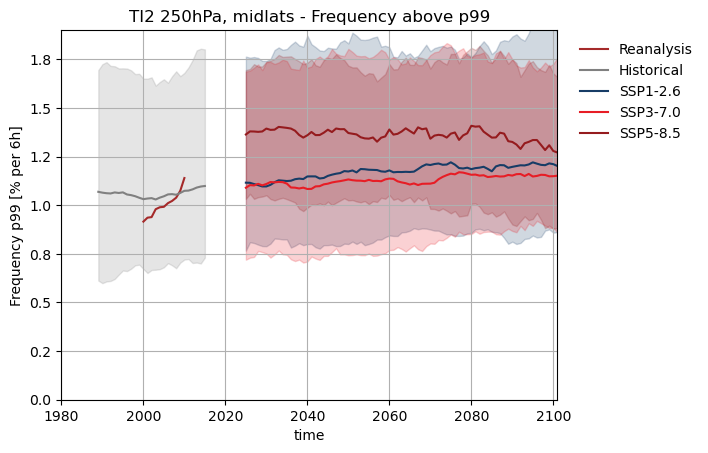

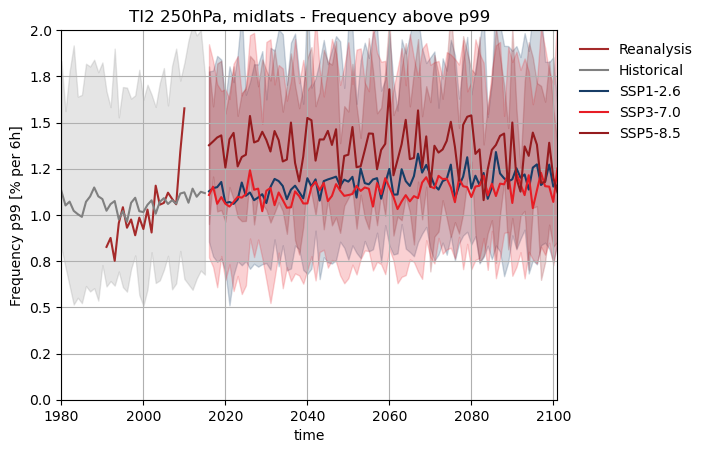

In [17]:
# ANNUAL:

#importlib.reload(auscat_plots)

time_selection = "annual"

outfile = (f"{path_stem}/"
           f"Timeseries_p99freq_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

auscat_plots.plot_timeseries_annual(ds_ts, turbulence_index, P, window_size, lat_box = box, ymax=0.019, save_fig = False, outfile = outfile)
print(outfile)
auscat_plots.plot_timeseries_annual(ds_ts, turbulence_index, P, window_size=1, lat_box = box, ymax = 0.02, save_fig = False, outfile = outfile)


using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Timeseries_p99freq_TI2_250hPa_midlats_coolwarm_rolling10.png
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historic

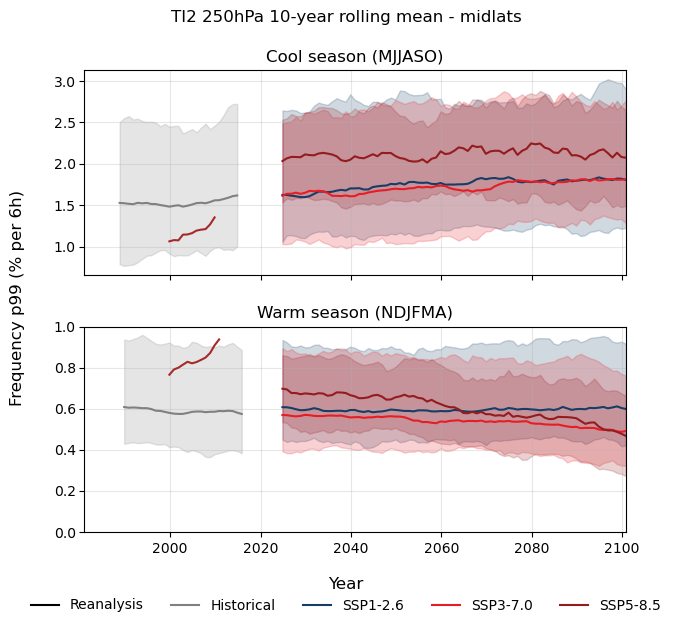

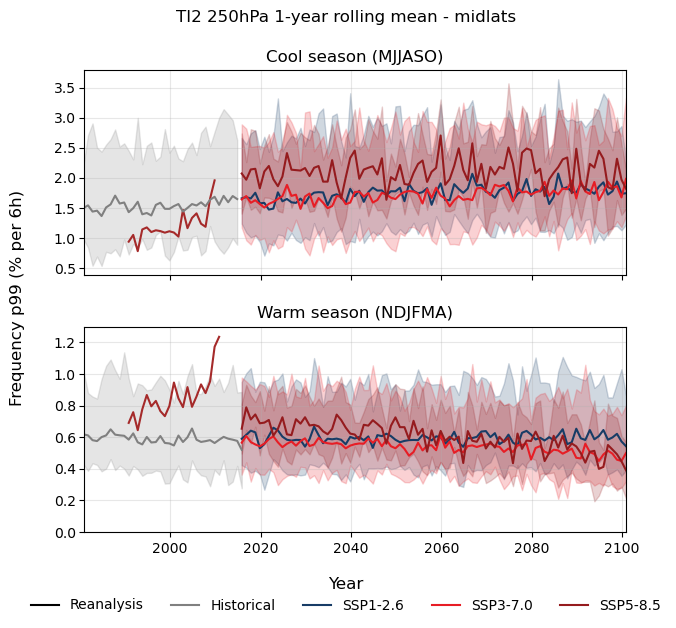

In [18]:
# COOL SEASON / WARM SEASON

#importlib.reload(auscat_plots)

time_selection = "coolwarm"

outfile = (f"{path_stem}/"
           f"Timeseries_p99freq_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")


# 10 year rolling mean:
auscat_plots.plot_timeseries_coolwarmseason(ds_ts, turbulence_index, P, window_size, lat_box=box, ymax=[3.3, 0.01], save_fig = False, outfile=outfile) 
print(outfile)
# 1 year rolling mean:
auscat_plots.plot_timeseries_coolwarmseason(ds_ts, turbulence_index, P, window_size = 1, lat_box=box, ymax=[0.025, 0.013], save_fig = False, outfile = outfile)   

DJF
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
MAM
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
JJA
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
SON
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
/scr

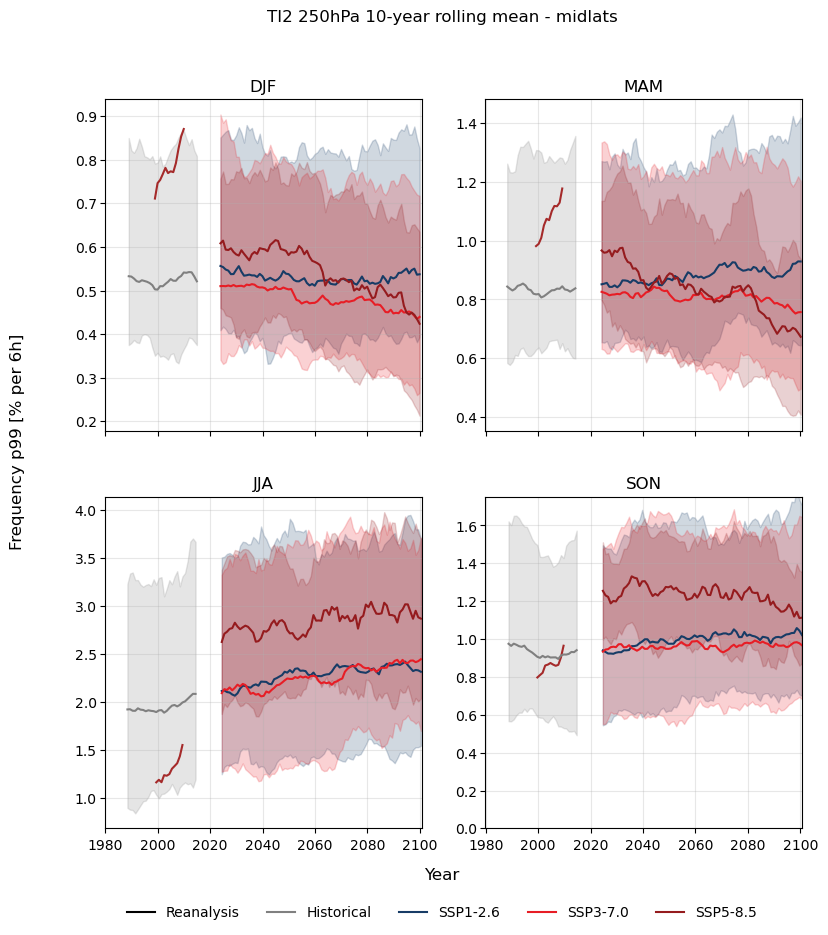

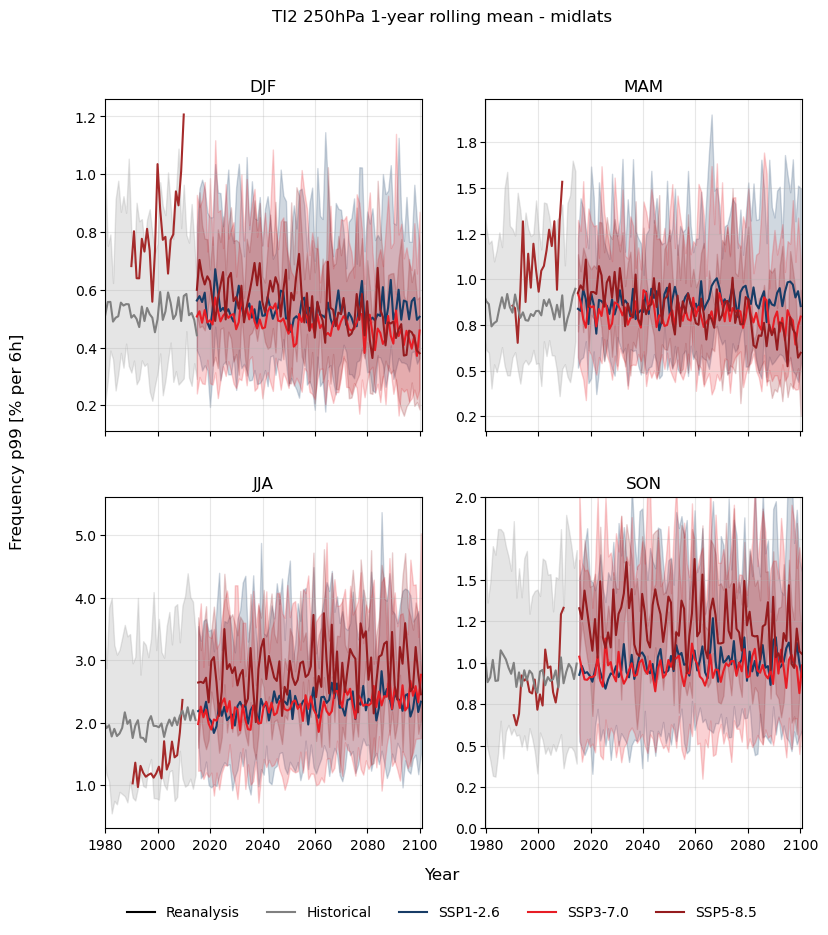

In [19]:
# BY SEASON:
#importlib.reload(auscat_plots)

time_selection = "season"

outfile = (f"{path_stem}/"
           f"Timeseries_p99freq_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

# 10 year rolling mean:
auscat_plots.plot_timeseries_season(ds_ts, turbulence_index, P, window_size, outfile = outfile, ymax=[0.01, 0.015, 
                                                                                                      0.03, 0.0175], save_fig = False, lat_box = box)
print(outfile)

auscat_plots.plot_timeseries_season(ds_ts, turbulence_index, P, window_size = 1, outfile = outfile, save_fig = False, lat_box = box,
                                    ymax=[0.01, 0.015, 
                                          0.03, 0.02])

using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
using ['historical_ACCESS-CM2_r4i1p1f1', 'historical_ACCESS-ESM1-5_r6i1p1f1', 'historical_CESM2_r11i1p1f1', 'historical_CMCC-ESM2_r1i1p1f1', 'historical_EC-Earth3_r1i1p1f1', 'historical_MPI-ESM1-2-HR_r1i1p1f1', 'historical_NorESM2-MM_r1i1p1f1']
using ['historical_A

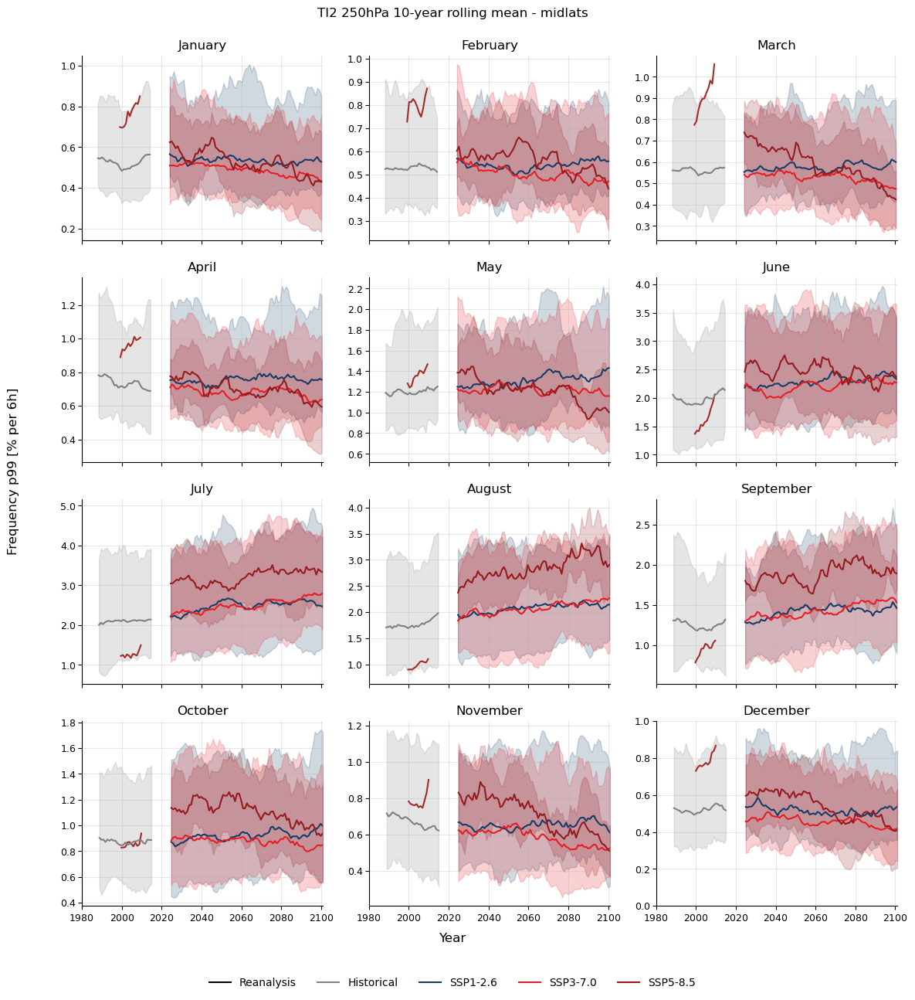

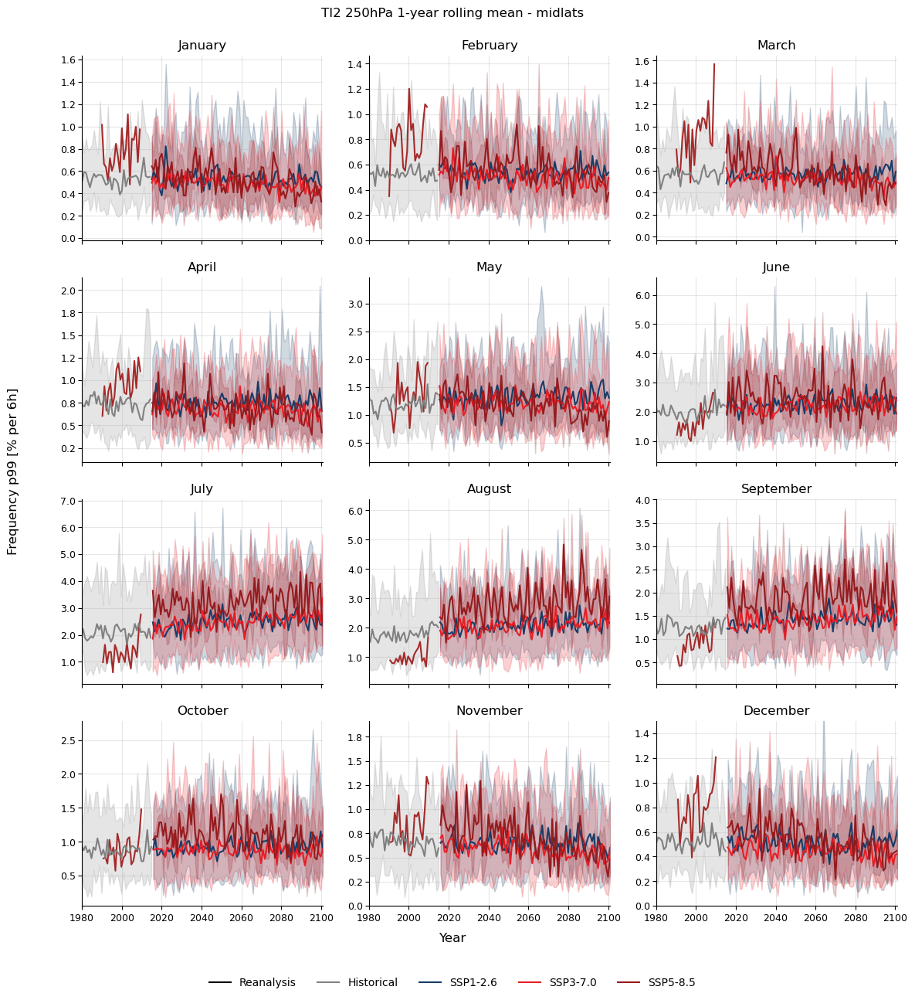

In [22]:
# BY MONTH:

#importlib.reload(auscat_plots)

time_selection = "monthly"

outfile = (f"{path_stem}/"
           f"Timeseries_p99freq_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

# 10 year rolling
auscat_plots.plot_timeseries_month(ds_ts, turbulence_index, P, window_size, outfile = outfile, save_fig = False, lat_box = box,
                                   ymax=[0.01, 0.01, 0.012,
                                          #Jan  #Feb  #Mar 
                                         0.011, 0.015, 0.03, 
                                         # Apr  #May   #Jun
                                         0.035, 0.03, 0.017, 
                                         #Jul   #Aug  #Sept
                                         0.01, 0.01, 0.01])
                                         #Oct  #Nov   #Dec


auscat_plots.plot_timeseries_month(ds_ts, turbulence_index, P, window_size=1, outfile = outfile, save_fig = False, lat_box = box,
                                   ymax=[0.01, 0.01, 0.012,
                                          #Jan  #Feb  #Mar 
                                         0.011, 0.015, 0.03, 
                                         # Apr  #May   #Jun
                                         0.035, 0.03, 0.017, 
                                         #Jul   #Aug  #Sept
                                         0.01, 0.01, 0.015])
                                         #Oct  #Nov   #Dec

print(outfile)

### Percentage change in frequency:

/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Timeseries-pct-change_TI2_250hPa_midlats_annual_rolling10.png


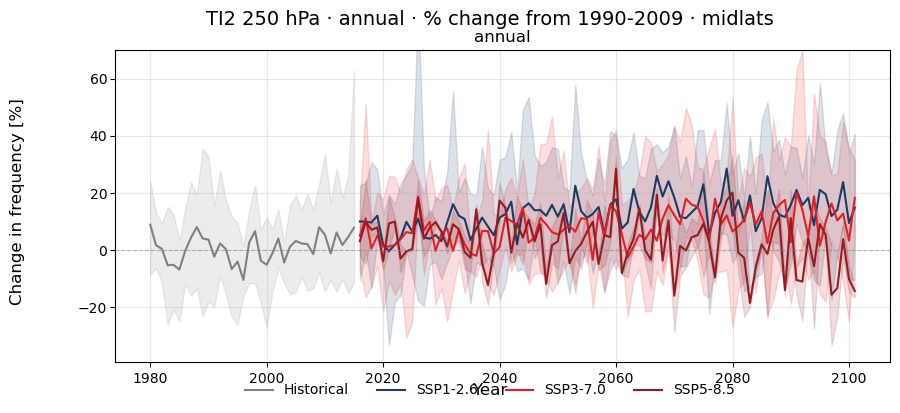

In [27]:
#importlib.reload(auscat_plots)

time_selection = 'annual'

outfile = (f"{path_stem}/"
           f"Timeseries-pct-change_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

auscat_plots.plot_timeseries_pct_change(ds_ts, turbulence_index, P,
                                        time_selection = time_selection,
                                        baseline_slice = baseline_time_slice, 
                                        window_size = 1, 
                                        lat_box=box, 
                                        save_fig=False, outfile = None,
                                        ymax=70, ymin=None)

print(outfile)

/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Timeseries-pct-change_TI2_250hPa_midlats_coolwarm_rolling10.png


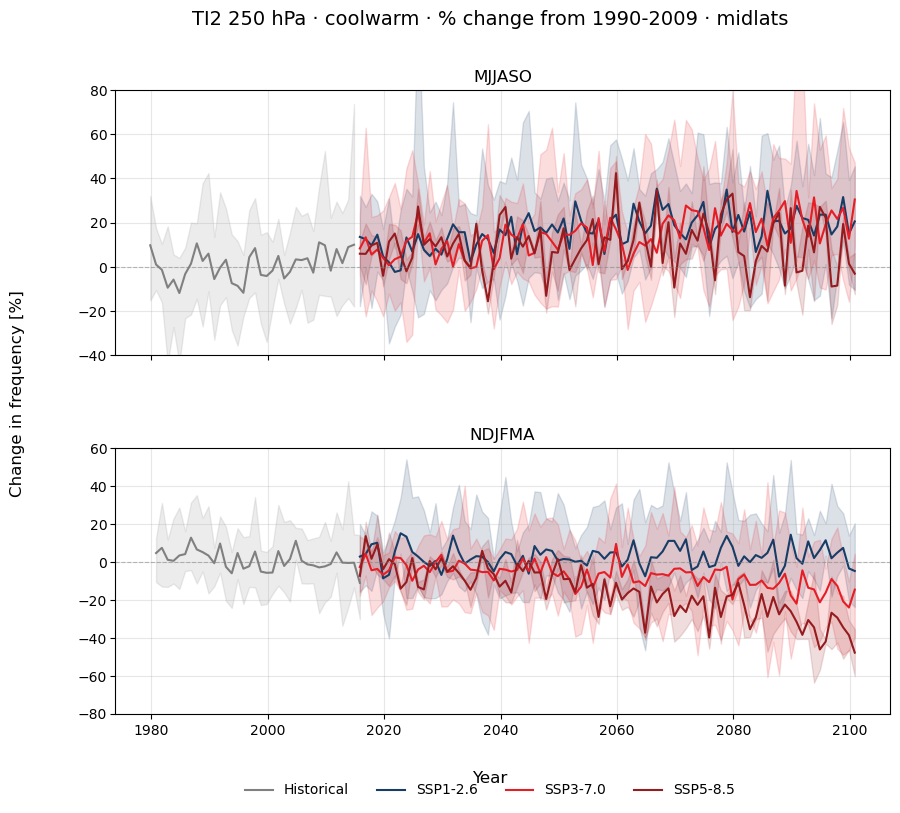

In [25]:
#importlib.reload(auscat_plots)

time_selection = 'coolwarm'

outfile = (f"{path_stem}/"
           f"Timeseries-pct-change_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

auscat_plots.plot_timeseries_pct_change(ds_ts, turbulence_index, P,
                                        time_selection = time_selection,
                                        baseline_slice = baseline_time_slice, 
                                        window_size = 1, 
                                        lat_box=box, 
                                        save_fig=False, outfile = None,
                                        ymax=[80, 60], ymin=[-40, -80])

print(outfile)

/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Timeseries-pct-change_TI2_250hPa_midlats_seasonal_rolling10.png


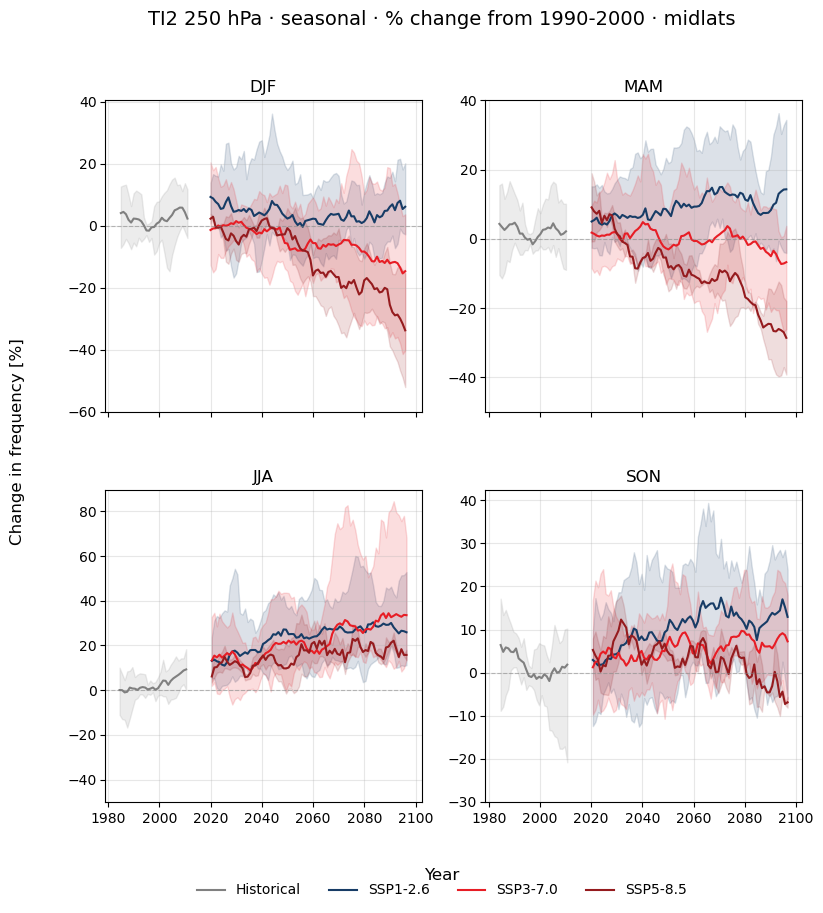

In [28]:
#importlib.reload(auscat_plots)

time_selection = 'seasonal'

outfile = (f"{path_stem}/"
           f"Timeseries-pct-change_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

auscat_plots.plot_timeseries_pct_change(ds_ts, turbulence_index, P,
                                        time_selection = time_selection,
                                        baseline_slice = slice("1990", "2000"), 
                                        window_size = 10, 
                                        lat_box=box, 
                                        save_fig=False, outfile = None,
                                        ymax=None, ymin=[-60, -50, -50, -30])

print(outfile)

/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Timeseries-pct-change_TI2_250hPa_midlats_monthly_rolling10.png


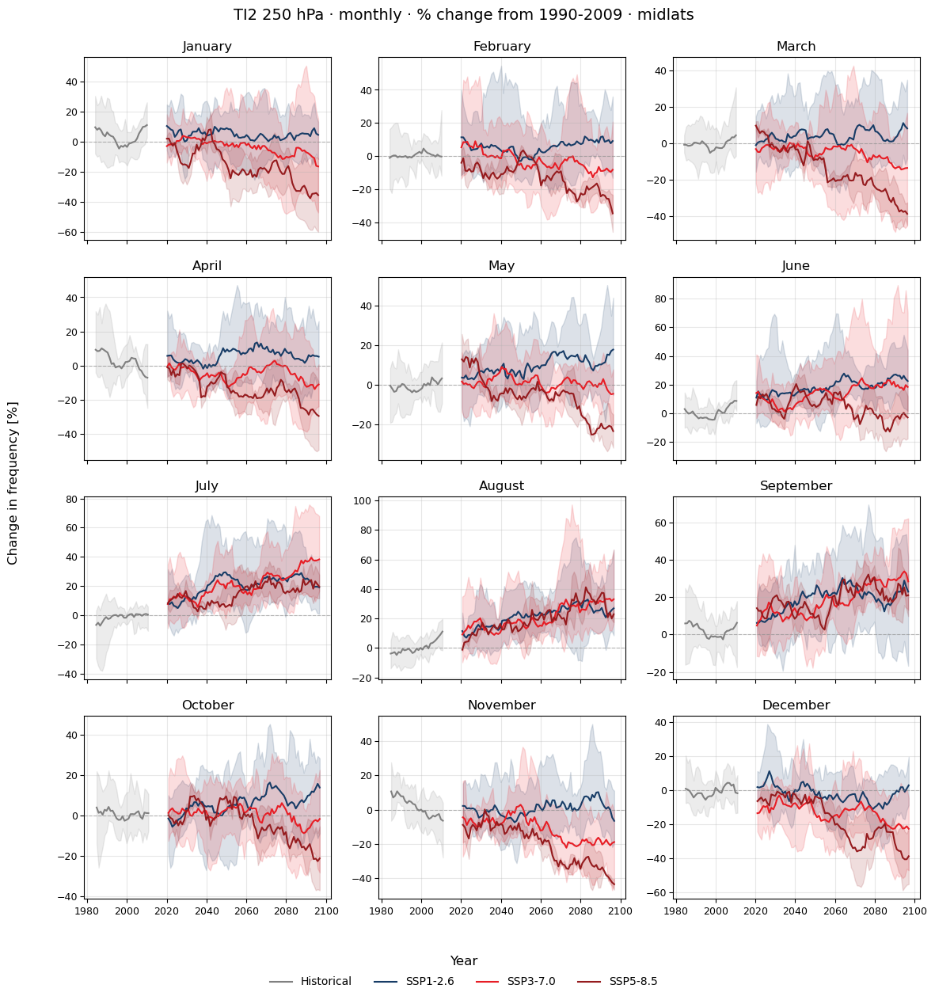

In [29]:
#importlib.reload(auscat_plots)

time_selection = 'monthly'

outfile = (f"{path_stem}/"
           f"Timeseries-pct-change_{turbulence_index}_{P}hPa_{box}_{time_selection}_rolling{window_size}.png")

auscat_plots.plot_timeseries_pct_change(ds_ts, turbulence_index, P,
                                        time_selection = time_selection,
                                        baseline_slice = baseline_time_slice, 
                                        window_size = 10, 
                                        lat_box=box, 
                                        save_fig=False, outfile = None,
                                        ymax=None, ymin=None)

print(outfile)

In [30]:
ds_eval.close

<bound method DataWithCoords.close of <xarray.Dataset> Size: 650MB
Dimensions:  (run: 1, time: 240, lat: 436, lon: 777)
Coordinates:
  * lon      (lon) float64 6kB 88.04 88.19 88.34 88.5 ... 207.6 207.8 207.9
  * lat      (lat) float64 3kB -53.58 -53.42 -53.27 -53.11 ... 13.32 13.48 13.63
  * time     (time) datetime64[ns] 2kB 1990-01-31 1990-02-28 ... 2009-12-31
  * run      (run) <U27 108B 'evaluation_BARRA-R_r1i1p1f1'
Data variables:
    TI2      (run, time, lat, lon) float64 650MB dask.array<chunksize=(1, 240, 436, 777), meta=np.ndarray>
Attributes:
    regrid_method:     bilinear
    turbulence_index:  TI2
    pressure_level:    250
    Description:       Frequency of TI2 at 250hPa above the 99th percentile f...
    p99:               2.847791621740251e-07>

## Future scenarios 

### 3+1 Test:

In [5]:
# Test on one experiemnt and index:

#importlib.reload(auscat_plots)

time_selection = "MJJASO"
experiment = "ssp370"

pickle_path = (f"{path_stem}/plot-pkls/"
               f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl" )
os.makedirs(os.path.dirname(pickle_path), exist_ok=True)


if os.path.exists(pickle_path):
    print(f"Already exists: {pickle_path}")

else:
    prepped = auscat_plots.prep_futures_1plus3(time_selection=time_selection,
                                           turbulence_index=turbulence_index,
                                           P=P,
                                           time_slices=[("1990", "2009")] + time_slices,
                                           experiment=experiment,
                                           all_agree_except=1,
                                           path_stem = path_stem
                                           )
    # pickle output for future use:
    with open(pickle_path, "wb") as f:
        pickle.dump(prepped, f)
        print(f"Saved: {pickle_path}")

  7 common runs found


TI2 250hPa ssp370 MJJASO:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_MJJASO_1plus3.pkl


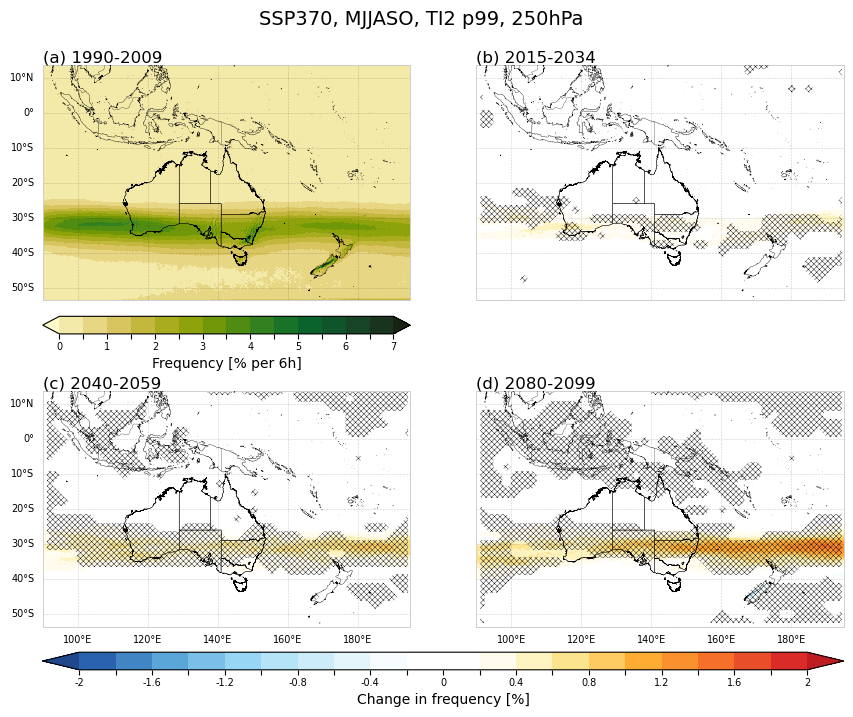

In [6]:
# plot

#importlib.reload(auscat_plots)

time_selection = "MJJASO"
experiment = "ssp370"

pickle_path = (f"{path_stem}/plot-pkls/"
               f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl" )

with open(pickle_path, "rb") as f:
    prepped = pickle.load(f)


fig, axs = auscat_plots.draw_futures_1plus3_2x2(prepped, figsize = (9,8), save_fig = False,
                                                outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_baseline-plus-3timeslices_2x2.png")

###  Running combo of all scenarios and time periods together:

In [7]:
# SAVE PICKLE OF PREPPED DATA FOR EACH COMBO:

#importlib.reload(auscat_plots)

P = 250

for turbulence_index in ["TI2"]:
    for time_selection in ["MJJASO", "annual", "NDJFMA", "SON", "MAM", "JJA", "DJF"]:
        for experiment in ["ssp126", "ssp370", 'ssp585']:

            if experiment == "ssp585":
                all_agree_except = 0
            else:
                all_agree_except = 1

            pickle_path = (
                f"{path_stem}/plot-pkls/"
                f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl" )

            if os.path.exists(pickle_path):
                print(f"Already exists: {pickle_path}")
                continue

            print(f"Preparing {turbulence_index}: {time_selection}, {experiment}")
            prepped = auscat_plots.prep_futures_1plus3(
                time_selection=time_selection,
                turbulence_index=turbulence_index,
                P=250,
                time_slices=[("1990", "2009")] + time_slices,
                experiment=experiment,
                all_agree_except=all_agree_except,
                path_stem = path_stem
                )

            os.makedirs(os.path.dirname(pickle_path), exist_ok=True)
            with open(pickle_path, "wb") as f:
                pickle.dump(prepped, f)

            print(f"Saved: {pickle_path}  ({os.path.getsize(pickle_path) / 1e6:.1f} MB)")

            del prepped
            gc.collect()


Preparing TI2: MJJASO, ssp126
  7 common runs found


TI2 250hPa ssp126 MJJASO:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_MJJASO_1plus3.pkl  (9.5 MB)
Already exists: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_MJJASO_1plus3.pkl
Preparing TI2: MJJASO, ssp585
  2 common runs found


TI2 250hPa ssp585 MJJASO:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_MJJASO_1plus3.pkl  (9.5 MB)
Preparing TI2: annual, ssp126
  7 common runs found


TI2 250hPa ssp126 annual:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_annual_1plus3.pkl  (9.5 MB)
Preparing TI2: annual, ssp370
  7 common runs found


TI2 250hPa ssp370 annual:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_annual_1plus3.pkl  (9.5 MB)
Preparing TI2: annual, ssp585
  2 common runs found


TI2 250hPa ssp585 annual:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_annual_1plus3.pkl  (9.5 MB)
Preparing TI2: NDJFMA, ssp126
  7 common runs found


TI2 250hPa ssp126 NDJFMA:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_NDJFMA_1plus3.pkl  (9.5 MB)
Preparing TI2: NDJFMA, ssp370
  7 common runs found


TI2 250hPa ssp370 NDJFMA:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_NDJFMA_1plus3.pkl  (9.5 MB)
Preparing TI2: NDJFMA, ssp585
  2 common runs found


TI2 250hPa ssp585 NDJFMA:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_NDJFMA_1plus3.pkl  (9.5 MB)
Preparing TI2: SON, ssp126
  7 common runs found


TI2 250hPa ssp126 SON:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_SON_1plus3.pkl  (9.5 MB)
Preparing TI2: SON, ssp370
  7 common runs found


TI2 250hPa ssp370 SON:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_SON_1plus3.pkl  (9.5 MB)
Preparing TI2: SON, ssp585
  2 common runs found


TI2 250hPa ssp585 SON:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_SON_1plus3.pkl  (9.5 MB)
Preparing TI2: MAM, ssp126
  7 common runs found


TI2 250hPa ssp126 MAM:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_MAM_1plus3.pkl  (9.5 MB)
Preparing TI2: MAM, ssp370
  7 common runs found


TI2 250hPa ssp370 MAM:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_MAM_1plus3.pkl  (9.5 MB)
Preparing TI2: MAM, ssp585
  2 common runs found


TI2 250hPa ssp585 MAM:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_MAM_1plus3.pkl  (9.5 MB)
Preparing TI2: JJA, ssp126
  7 common runs found


TI2 250hPa ssp126 JJA:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_JJA_1plus3.pkl  (9.5 MB)
Preparing TI2: JJA, ssp370
  7 common runs found


TI2 250hPa ssp370 JJA:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_JJA_1plus3.pkl  (9.5 MB)
Preparing TI2: JJA, ssp585
  2 common runs found


TI2 250hPa ssp585 JJA:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_JJA_1plus3.pkl  (9.5 MB)
Preparing TI2: DJF, ssp126
  7 common runs found


TI2 250hPa ssp126 DJF:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp126_DJF_1plus3.pkl  (9.5 MB)
Preparing TI2: DJF, ssp370
  7 common runs found


TI2 250hPa ssp370 DJF:   0%|          | 0/7 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp370_DJF_1plus3.pkl  (9.5 MB)
Preparing TI2: DJF, ssp585
  2 common runs found


TI2 250hPa ssp585 DJF:   0%|          | 0/2 [00:00<?, ?it/s]

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/prepped_TI2_250hPa_mmm-p99_ssp585_DJF_1plus3.pkl  (9.5 MB)


/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp126_MJJASO_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp370_MJJASO_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp585_MJJASO_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp126_annual_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp370_annual_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp585_annual_baseline-plus-3timeslices_2x2.png
/scratch/v

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:4071: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs_2d = plt.subplots(


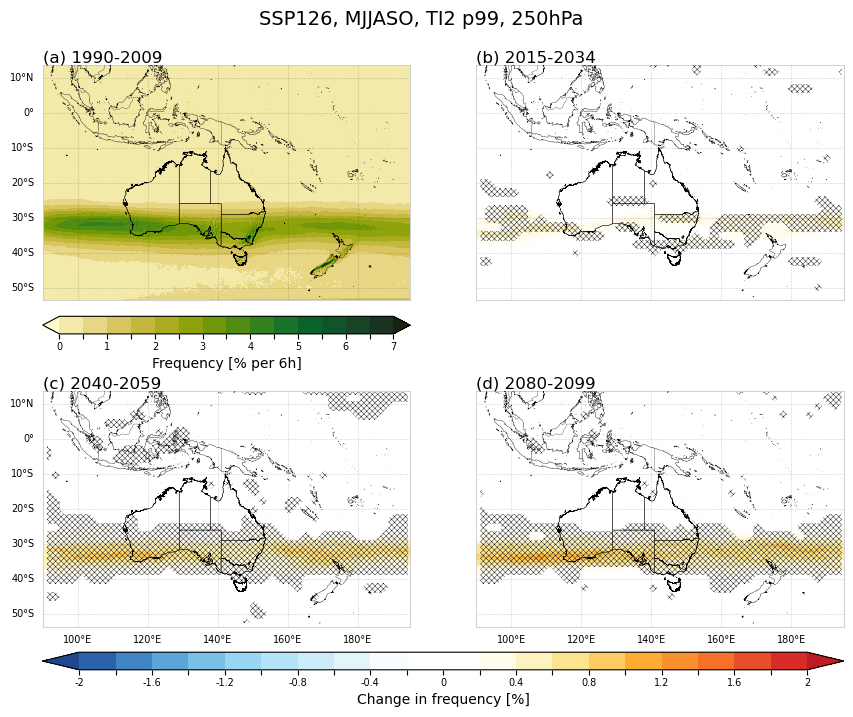

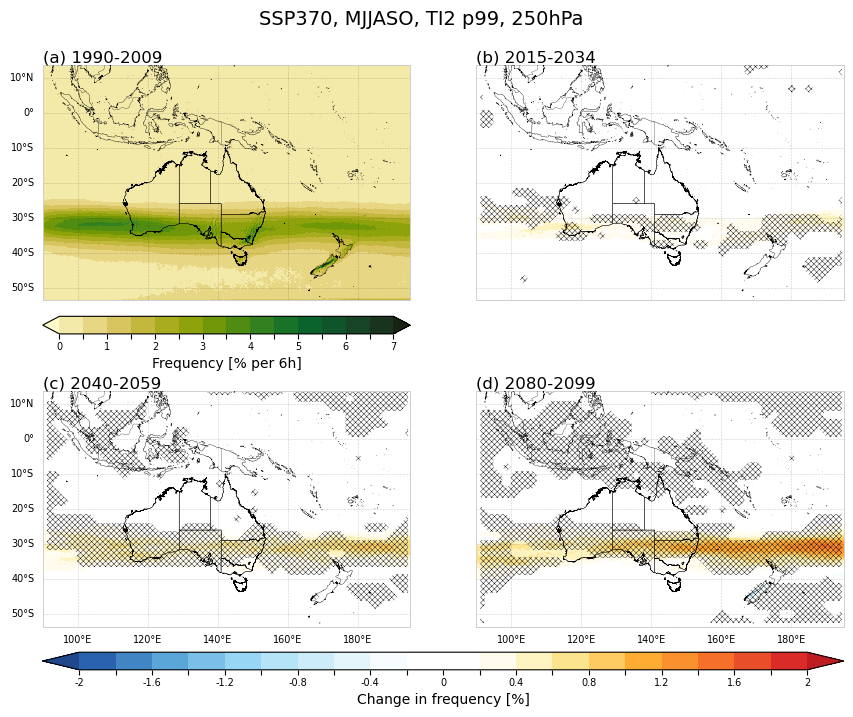

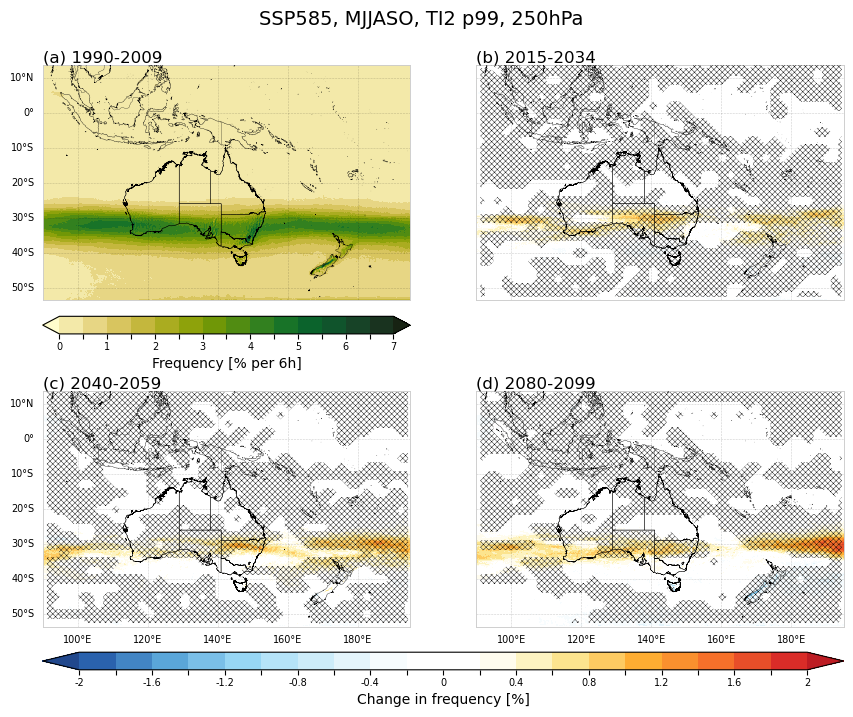

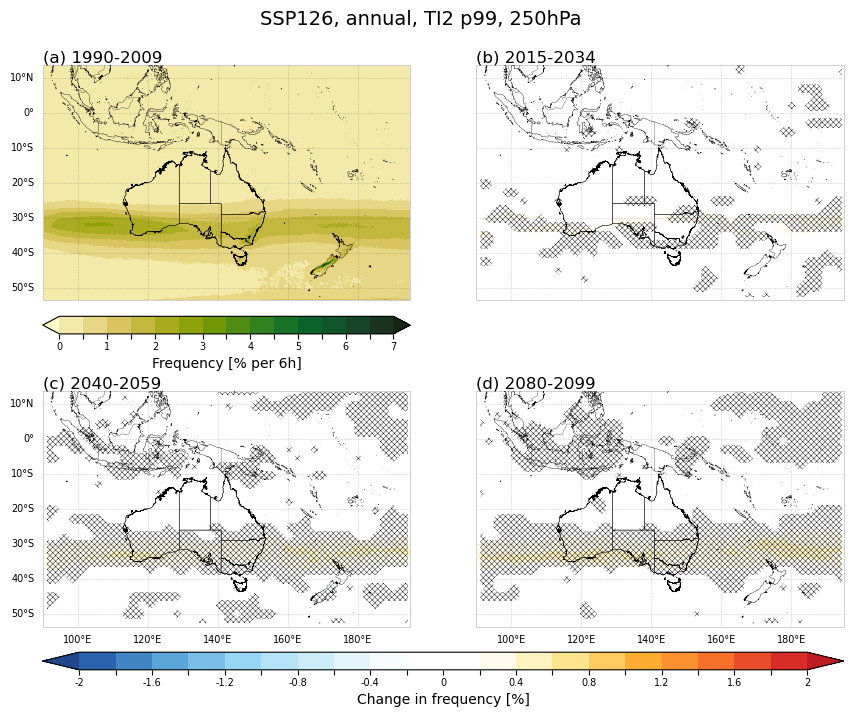

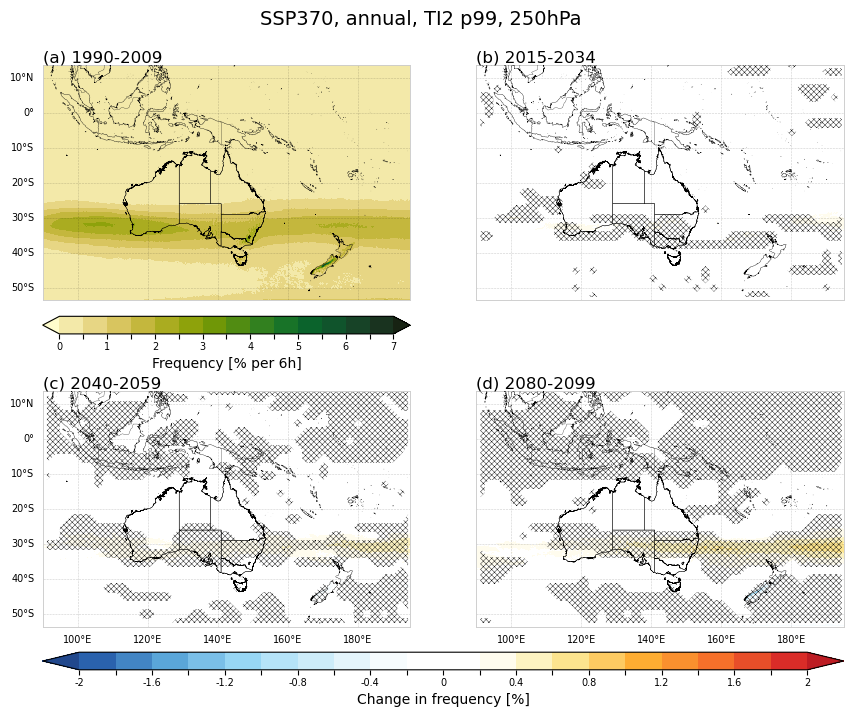

...

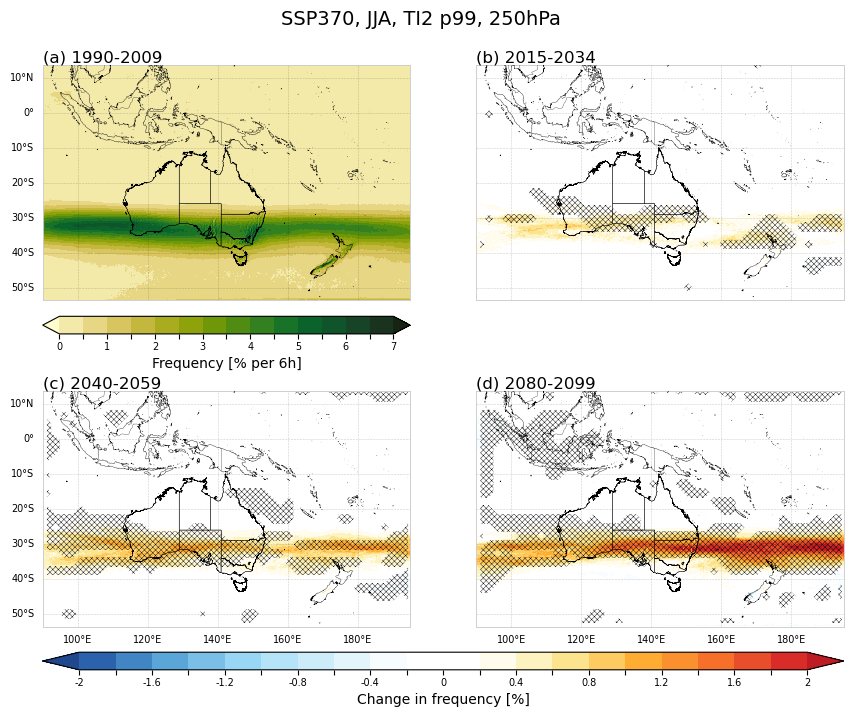

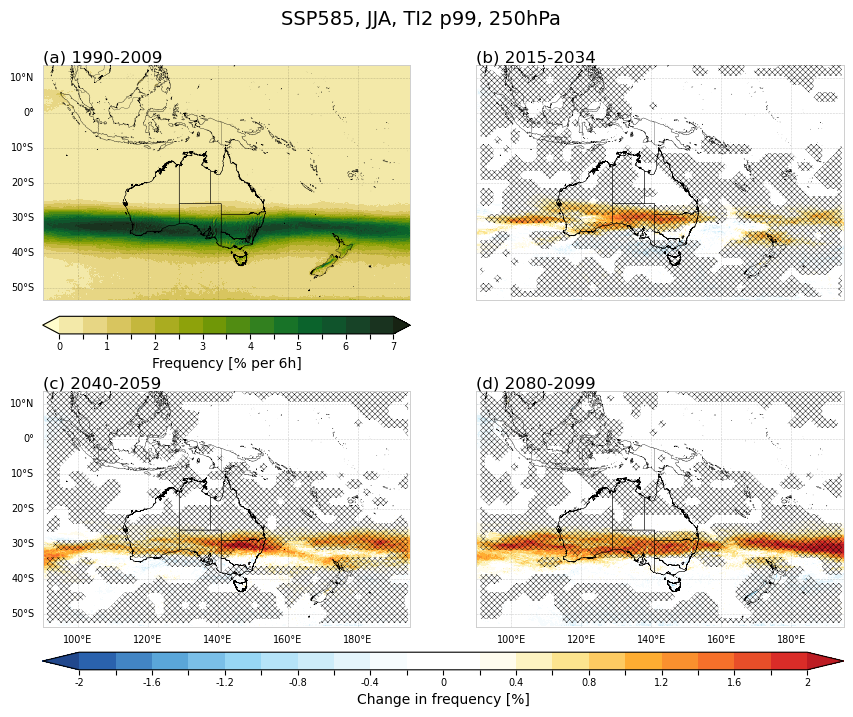

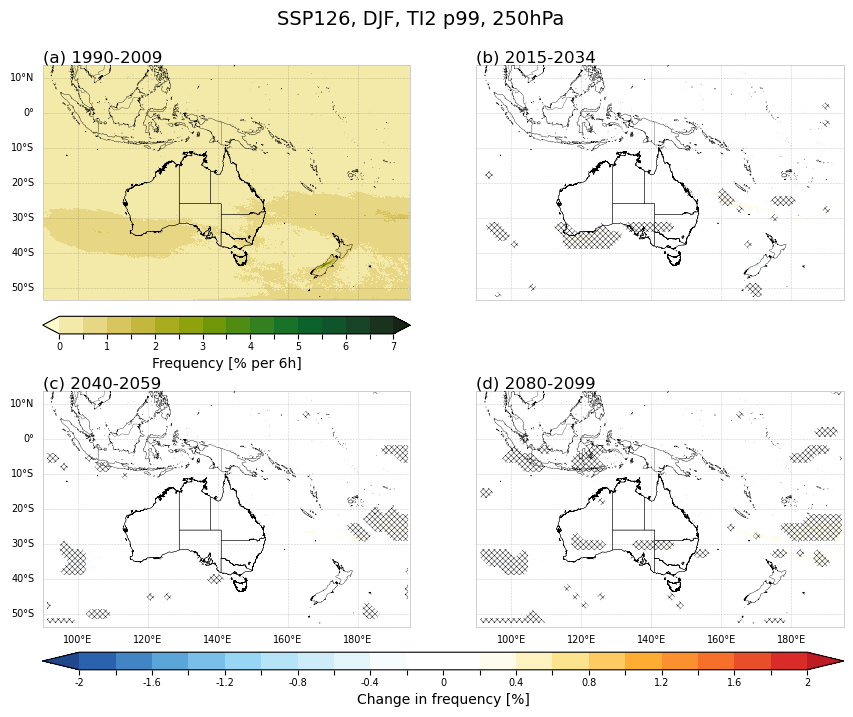

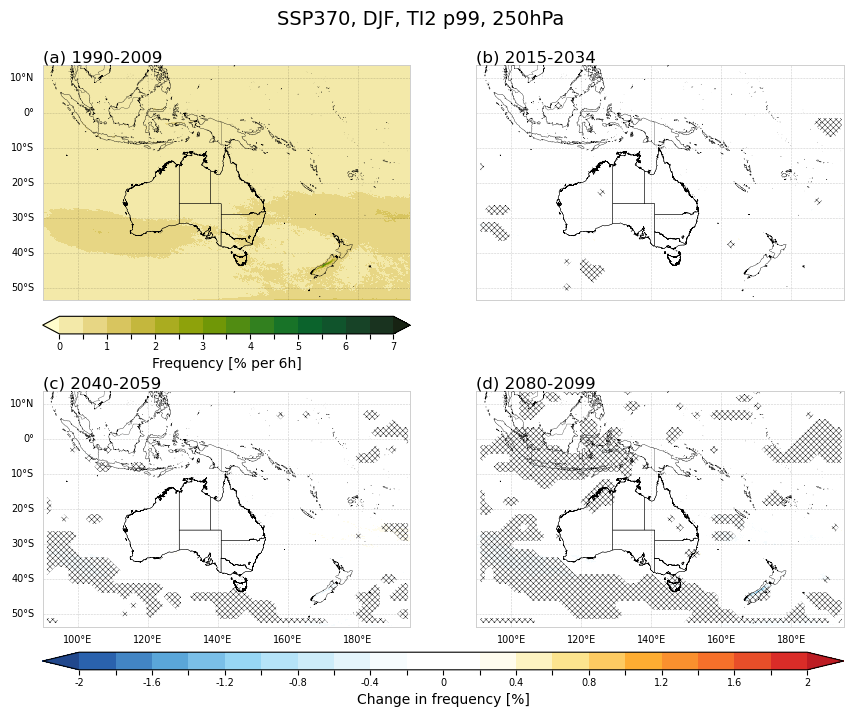

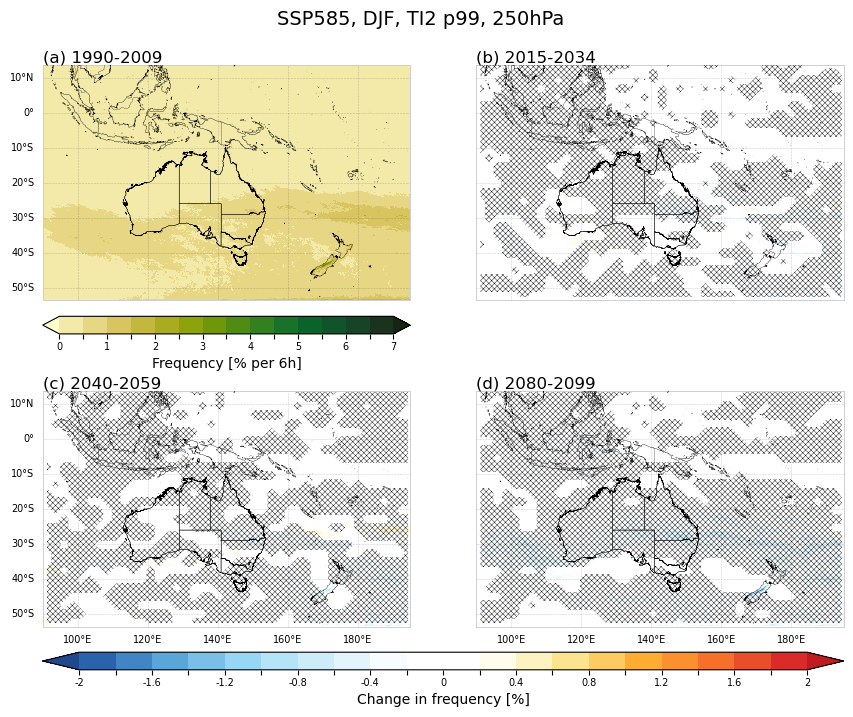

In [9]:
# PLOT EACH PICKLE PATH:

#importlib.reload(auscat_plots)

for turbulence_index in ["TI2"]:
    for time_selection in ["MJJASO", "annual", "NDJFMA", "SON", "MAM", "JJA", "DJF"]:
        for experiment in ["ssp126", "ssp370", 'ssp585']:
            
            # open pre-prepped file:
            pickle_path = (
                f"{path_stem}/plot-pkls/"
                f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl")

            with open(pickle_path, "rb") as f:
                prepped = pickle.load(f)

            # outfile for saving figures:
            outfile = (f"{path_stem}/"
                       f"Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_baseline-plus-3timeslices_2x2.png")
            os.makedirs(os.path.dirname(outfile), exist_ok=True)

            # run 2x2 figure
            print(outfile)
            fig, axs = auscat_plots.draw_futures_1plus3_2x2(prepped, 
                                                            figsize = (9,8), 
                                                            save_fig = False, 
                                                            outfile = outfile
                                                            )

### Test percentage change in frequency per 6 hours

In [10]:
# Test on one experiemnt and index:
#importlib.reload(auscat_plots)

turbulence_index = "TI2"
time_selection = "NDJFMA"
experiment = "ssp370"

pickle_path = (f"{path_stem}/plot-pkls/pct-change/"
               f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl")
os.makedirs(os.path.dirname(pickle_path), exist_ok=True)

if os.path.exists(pickle_path):
    print(f"Already exists: {pickle_path}")

else:
    prepped = auscat_plots.prep_futures_1plus3(time_selection=time_selection,
                                            turbulence_index=turbulence_index,
                                            P=P,
                                            time_slices=[("1990", "2009")] + time_slices,
                                            experiment=experiment,
                                            all_agree_except=1,
                                            path_stem = path_stem,
                                            pct_change = True,
                                            )


    # pickle output for future use:
    with open(pickle_path, "wb") as f:
        pickle.dump(prepped, f)

    print(f"Saved: {pickle_path}")

    del prepped
    gc.collect()

  7 common runs found


TI2 250hPa ssp370 NDJFMA:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp370_NDJFMA_1plus3.pkl


(<Figure size 900x800 with 6 Axes>,
 array([<GeoAxes: title={'left': '(a) 1990-2009'}>,
        <GeoAxes: title={'left': '(b) 2015-2034'}>,
        <GeoAxes: title={'left': '(c) 2040-2059'}>,
        <GeoAxes: title={'left': '(d) 2080-2099'}>], dtype=object))

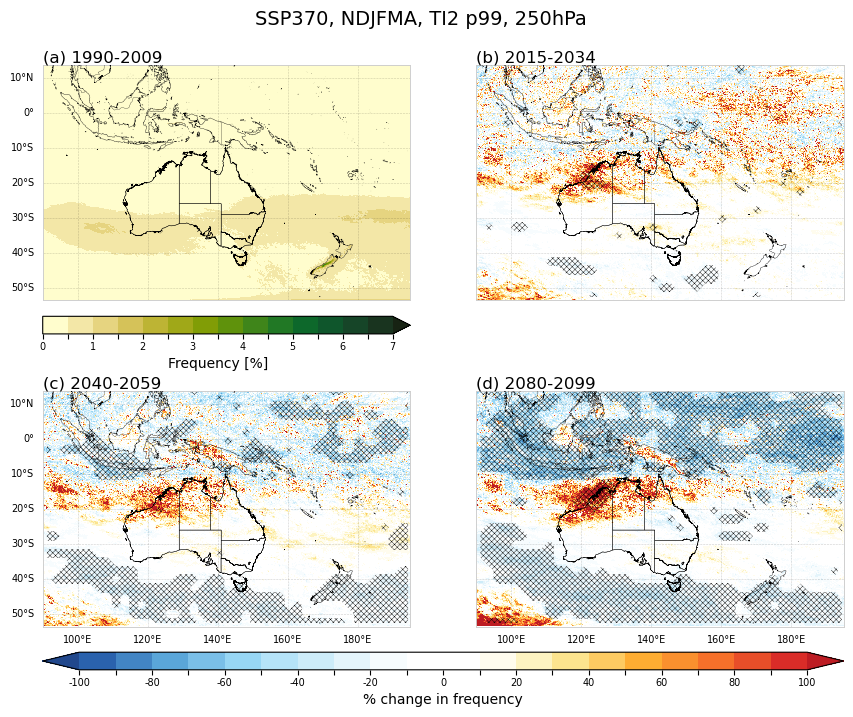

In [11]:
# plot
#importlib.reload(auscat_plots)

pickle_path = (f"{path_stem}/plot-pkls/pct-change/"
               f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl")

with open(pickle_path, "rb") as f:
    prepped = pickle.load(f)

auscat_plots.draw_futures_1plus3_2x2_pct(prepped, 
                                         ticks_max=100,
                                         min_baseline = 0,
                                         outfile = None, save_fig = False)

### Percentage change in frequency per 6 hours

In [ ]:
# SAVE PICKLE OF PREPPED DATA FOR EACH COMBO:

#importlib.reload(auscat_plots)

P = 250

for turbulence_index in ["TI2"]:
    for time_selection in ["MJJASO", "annual", "NDJFMA", "JJA", "DJF"]:
        for experiment in ["ssp126", "ssp370", 'ssp585']:

            if experiment == "ssp585":
                all_agree_except = 0
            else:
                all_agree_except = 1

            pickle_path = (f"{path_stem}/plot-pkls/pct-change/"
                           f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl")


            if os.path.exists(pickle_path):
                print(f"Already exists: {pickle_path}")
                continue

            print(f"Preparing {turbulence_index}: {time_selection}, {experiment}")
            prepped = auscat_plots.prep_futures_1plus3(
                time_selection=time_selection,
                turbulence_index=turbulence_index,
                P=250,
                time_slices=[("1990", "2009")] + time_slices,
                experiment=experiment,
                all_agree_except=all_agree_except,
                path_stem = path_stem,
                pct_change = True
                )

            os.makedirs(os.path.dirname(pickle_path), exist_ok=True)
            with open(pickle_path, "wb") as f:
                pickle.dump(prepped, f)

            print(f"Saved: {pickle_path}  ({os.path.getsize(pickle_path) / 1e6:.1f} MB)")

            del prepped
            gc.collect()


Preparing TI2: MJJASO, ssp126
  7 common runs found


TI2 250hPa ssp126 MJJASO:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp126_MJJASO_1plus3.pkl  (9.5 MB)
Preparing TI2: MJJASO, ssp370
  7 common runs found


TI2 250hPa ssp370 MJJASO:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp370_MJJASO_1plus3.pkl  (9.5 MB)
Preparing TI2: MJJASO, ssp585
  2 common runs found


TI2 250hPa ssp585 MJJASO:   0%|          | 0/2 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp585_MJJASO_1plus3.pkl  (9.5 MB)
Preparing TI2: annual, ssp126
  7 common runs found


TI2 250hPa ssp126 annual:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp126_annual_1plus3.pkl  (9.5 MB)
Preparing TI2: annual, ssp370
  7 common runs found


TI2 250hPa ssp370 annual:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp370_annual_1plus3.pkl  (9.5 MB)
Preparing TI2: annual, ssp585
  2 common runs found


TI2 250hPa ssp585 annual:   0%|          | 0/2 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp585_annual_1plus3.pkl  (9.5 MB)
Preparing TI2: NDJFMA, ssp126
  7 common runs found


TI2 250hPa ssp126 NDJFMA:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp126_NDJFMA_1plus3.pkl  (9.5 MB)
Already exists: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp370_NDJFMA_1plus3.pkl
Preparing TI2: NDJFMA, ssp585
  2 common runs found


TI2 250hPa ssp585 NDJFMA:   0%|          | 0/2 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp585_NDJFMA_1plus3.pkl  (9.5 MB)
Preparing TI2: JJA, ssp126
  7 common runs found


TI2 250hPa ssp126 JJA:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp126_JJA_1plus3.pkl  (9.5 MB)
Preparing TI2: JJA, ssp370
  7 common runs found


TI2 250hPa ssp370 JJA:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp370_JJA_1plus3.pkl  (9.5 MB)
Preparing TI2: JJA, ssp585
  2 common runs found


TI2 250hPa ssp585 JJA:   0%|          | 0/2 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp585_JJA_1plus3.pkl  (9.5 MB)
Preparing TI2: DJF, ssp126
  7 common runs found


TI2 250hPa ssp126 DJF:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp126_DJF_1plus3.pkl  (9.5 MB)
Preparing TI2: DJF, ssp370
  7 common runs found


TI2 250hPa ssp370 DJF:   0%|          | 0/7 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp370_DJF_1plus3.pkl  (9.5 MB)
Preparing TI2: DJF, ssp585
  2 common runs found


TI2 250hPa ssp585 DJF:   0%|          | 0/2 [00:00<?, ?it/s]

/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: divide by zero encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) / baseline.values * 100, 0.0,)
/home/563/ls7238/code/CAT_turbulence/gen_work/turbulence_AUSCAT/auscat_plots.py:3910: RuntimeWarning: invalid value encountered in divide
  delta_vals = np.where(baseline.values > 1e-15, (future_mean.values - baseline.values) /

Saved: /scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/plot-pkls/pct-change/prepped_TI2_250hPa_mmm-p99_ssp585_DJF_1plus3.pkl  (9.5 MB)


/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp126_MJJASO_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp370_MJJASO_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp585_MJJASO_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp126_annual_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp370_annual_baseline-plus-3timeslices_2x2.png
/scratch/v46/ls7238/CAT_turbulence/TI2/250hPa/mmm-p99/Future_decades_TI2_250hPa_change_in_frequency_of_exceeding_p99_ssp585_annual_baseline-plus-3timeslices_2x2.png
/scratch/v

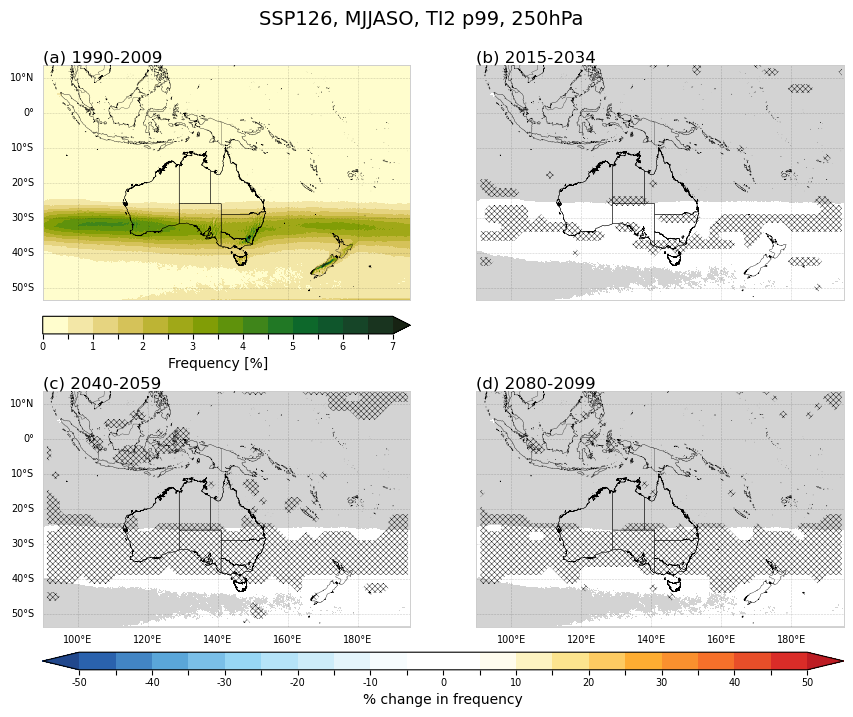

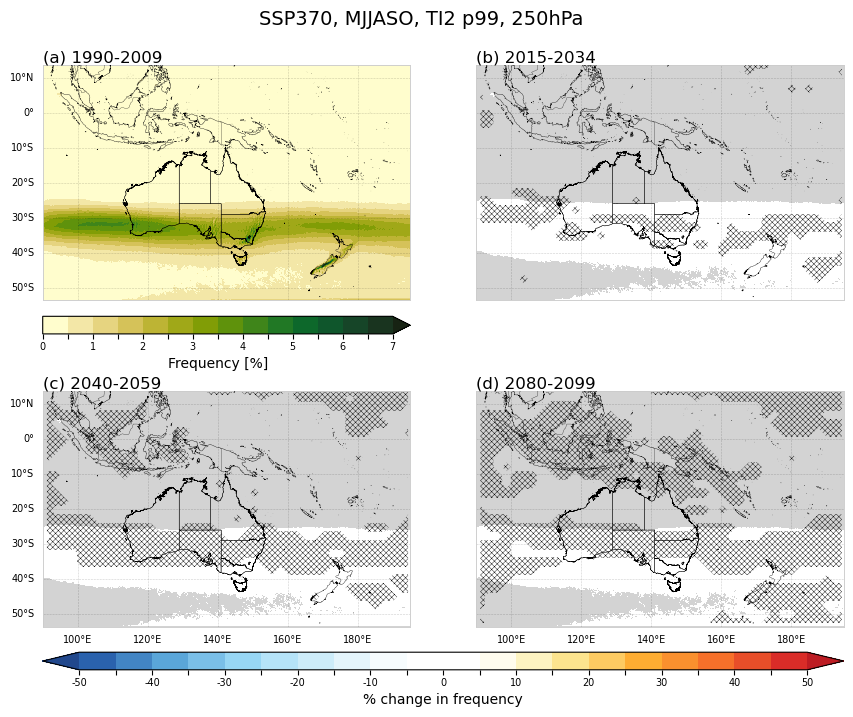

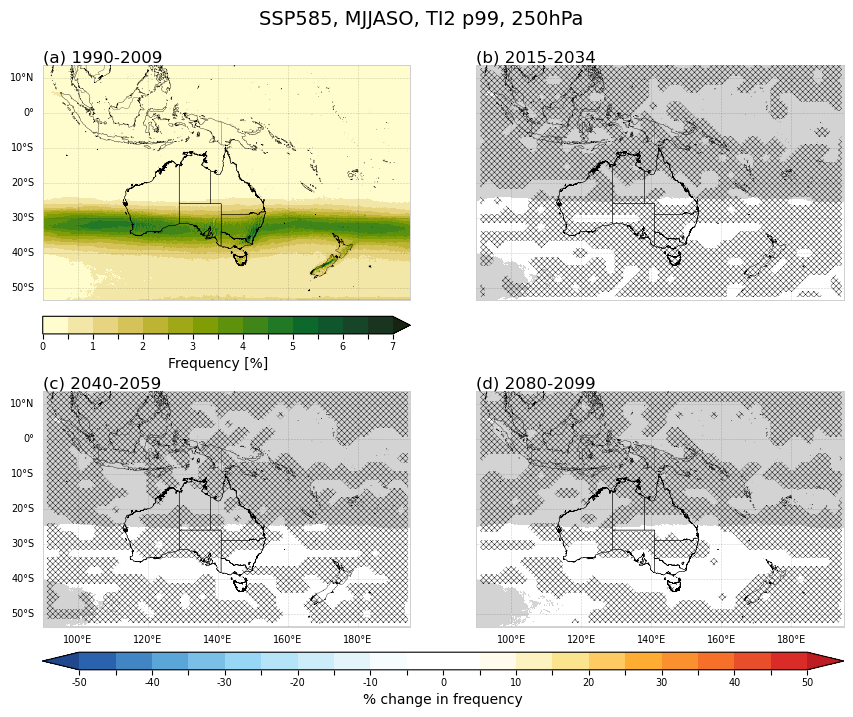

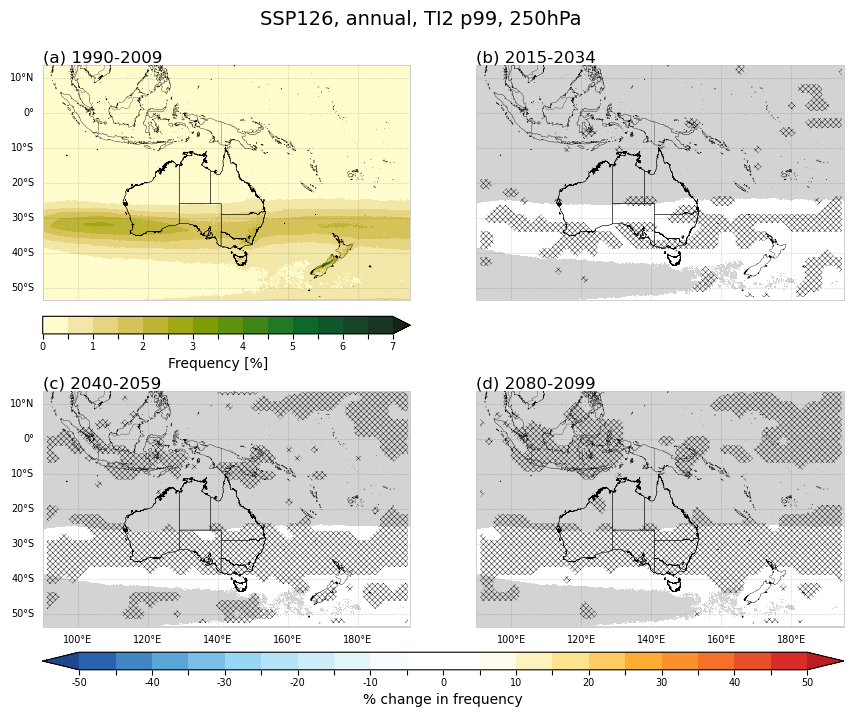

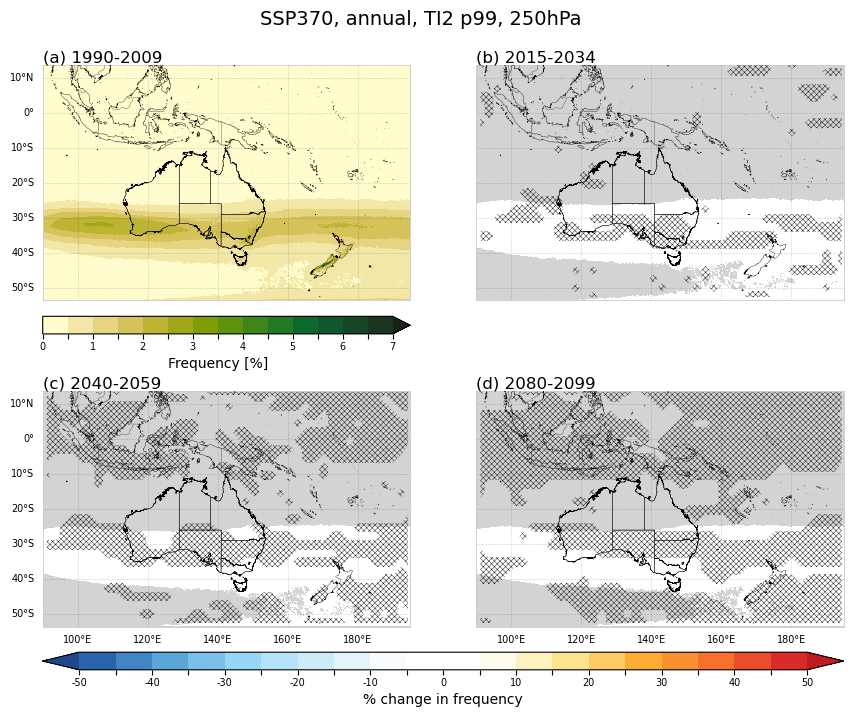

...

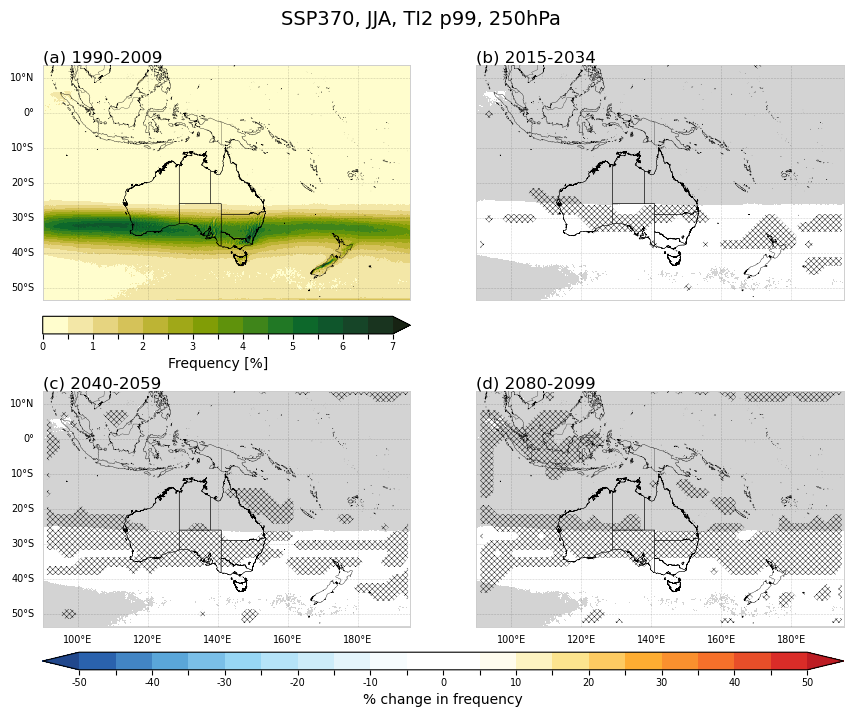

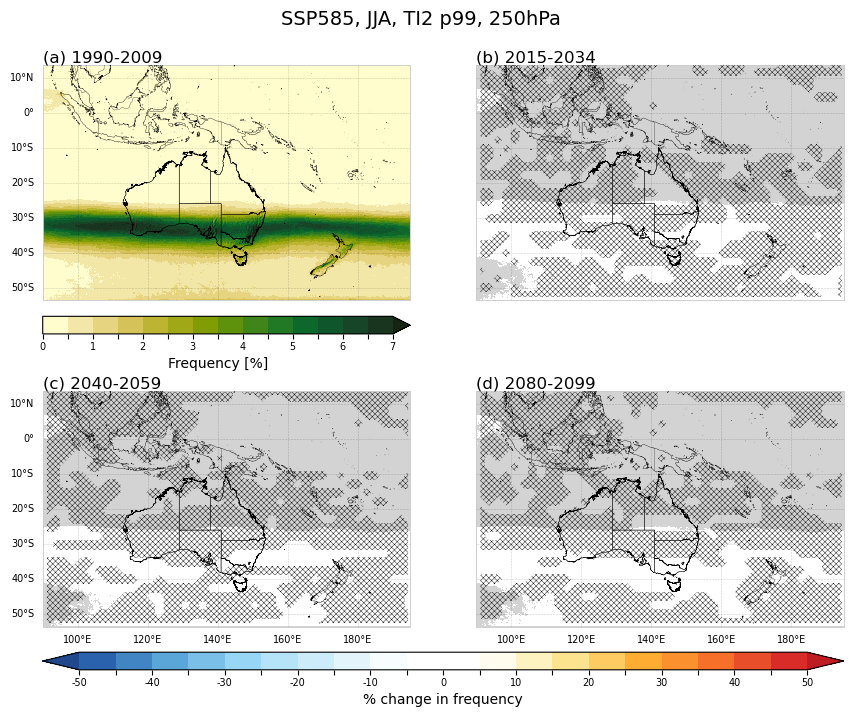

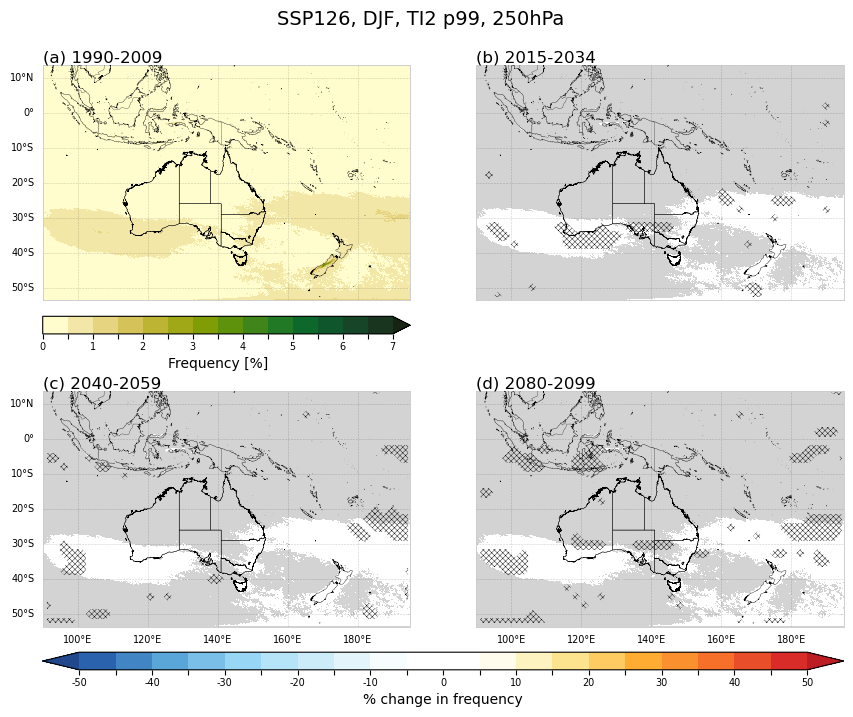

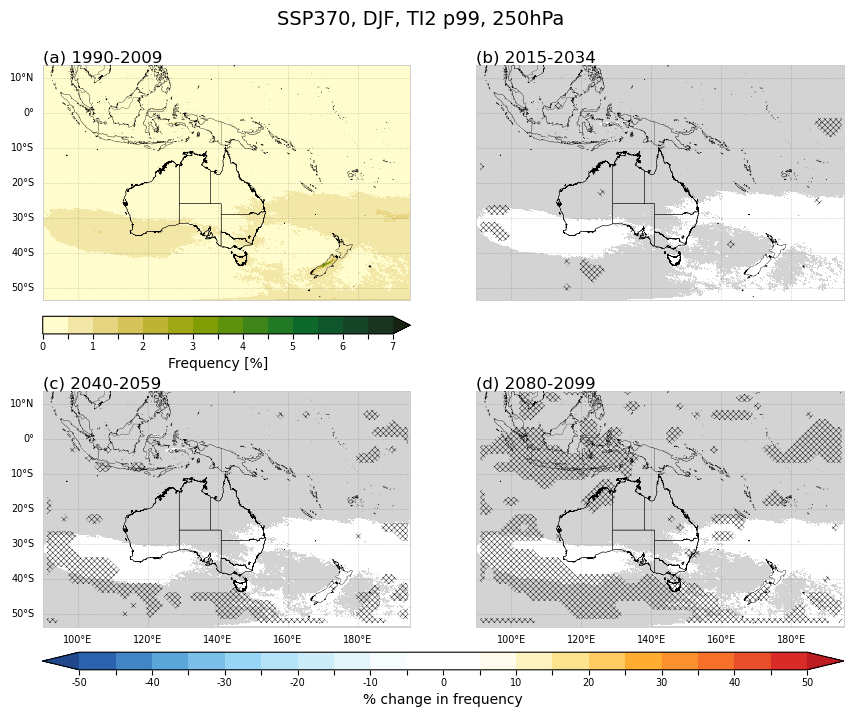

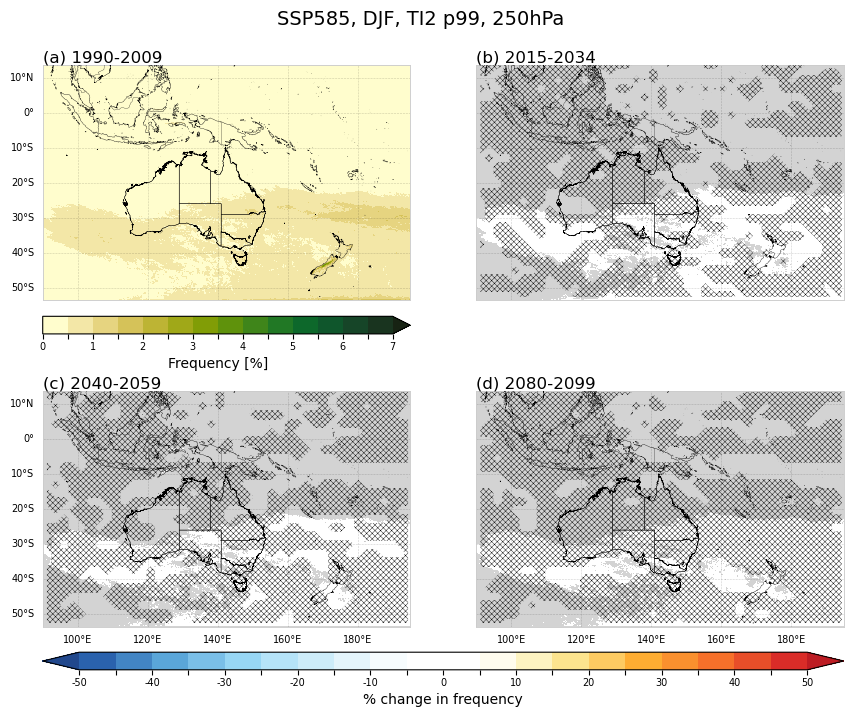

In [13]:
# PLOT EACH PICKLE PATH:

#importlib.reload(auscat_plots)

for turbulence_index in ["TI2"]:
    for time_selection in ["MJJASO", "annual", "NDJFMA", "JJA", "DJF"]:
        for experiment in ["ssp126", "ssp370", 'ssp585']:
            
            # open pre-prepped file:
            pickle_path = (
                f"{path_stem}/plot-pkls/"
                f"prepped_{turbulence_index}_{P}hPa_{p99}_{experiment}_{time_selection}_1plus3.pkl")

            with open(pickle_path, "rb") as f:
                prepped = pickle.load(f)

            # outfile for saving figures:
            outfile = (f"{path_stem}/"
                       f"Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_baseline-plus-3timeslices_2x2.png")
            os.makedirs(os.path.dirname(outfile), exist_ok=True)

            # run 2x2 figure
            print(outfile)
            fig, axs = auscat_plots.draw_futures_1plus3_2x2_pct(prepped, 
                                                               figsize = (9,8), 
                                                               save_fig = False, 
                                                               outfile = outfile
                                                               )

## Historical vs future (Model)

### MMM:

In [ ]:
from dask.distributed import Client

# formatted for XXL - 28 cores and 128GB memory (+ some overhead)

client = Client(
    n_workers=7,          
    threads_per_worker=1,
    memory_limit="15GB",    
)
client


In [ ]:
# Prep and save info for plots:

importlib.reload(auscat_plots)

# Choose turbulence index, pressure level, and lat/lon bounding:

turbulence_index = "TI1"      # Options: ['air_density', 'theta', 'dtheta_dz', 'coriolis_freq', 'windspeed', 
                              #            'VWS', 'N2', 'PV', 'DEF', 'DIV', 'DVT', 'Ri', 'TI1', 'TI2', 'TI3']

P=250                       # Stick to 250 as 200 may not be as reliable!!

box = "extendedlat"
lat_slice = slice(-50, -10)            # Options: 
                                      # just mid-lat band: slice(-50, -25)
                                      # extended lat to top aus: slice(-50,-10)
lon_slice = slice(90, 195)            # Options:
                                      # full width of figure: slice(90, 195)
                                      # reduced to just aus: slice(90, 155) 

experiments = ["ssp126", "ssp370", 'ssp585']

time_selections = ["annual"] + list(auscat_plots.TIME_GROUPS.keys())  # annual, monthly, seasonal, coolwarm

for time_selection in time_selections:
    for experiment in experiments:
    
        outfile = (
            f"{path_stem}/plot-pkls/"
            f"prepped_{turbulence_index}_{P}hPa_{experiment}_{time_selection}_{box}_histvsfuturewdiff.pkl")
        
        if os.path.exists(outfile):
            print(f"Skipping {time_selection}, already exists: {outfile}")
            continue

        print(f"Starting {time_selection} at {datetime.datetime.now().strftime('%H:%M')}")

        prepped = auscat_plots.prep_hist_vs_future_with_diff(
            turbulence_index=turbulence_index,
            P=P,
            time_selection=time_selection,
            experiment=experiment,
            future_period=("2040", "2059"),
            all_agree_except=1,
            pickle_path=outfile,
            path_stem = path_stem)
        
        del prepped
        gc.collect()

        print(f"---> Done {time_selection}")

print("\nAll done!")


In [ ]:
# Plot prepped data

#importlib.reload(auscat_plots)

P = 250
experiment = "ssp370"
box = "extendedlat"
turbulence_index = "TI1"  

for time_selection in ["annual"] + list(auscat_plots.TIME_GROUPS.keys()):
    pickle_path = (
        f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
        f"prepped_{turbulence_index}_{P}hPa_{experiment}_{time_selection}_{box}_histvsfuturewdiff.pkl"
    )
    with open(pickle_path, "rb") as f:
        prepped = pickle.load(f)

    fig, axs = auscat_plots.draw_hist_vs_future_with_diff(
        prepped,
        share_cbar=False,
        save_fig=True,
        outfile=(
            f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
            f"histvs{experiment}_{turbulence_index}_{time_selection}_2040-2059.png")
    )
    plt.show()


### Per model:

In [ ]:
# PREP FILES FOR PLOTS:

importlib.reload(auscat_plots)
import itertools

client = Client(n_workers=4, threads_per_worker=2, memory_limit="11GB")

box = "extendedlat"
lat_slice = slice(-50, -10)           # Options: 
                                      # just mid-lat band: slice(-50, -25)
                                      # extended lat to top aus: slice(-50,-10)
lon_slice = slice(90, 195)            # Options:
                                      # full width of figure: slice(90, 195)
                                      # reduced to just aus: slice(90, 155) 

experiment = "ssp370"
box = "extendedlat"
time_selections    = ["annual"] + list(auscat_plots.TIME_GROUPS.keys())
turbulence_indices = ["VWS", "windspeed", "TI1"]
pressure_levels    = [250, 200]

for turbulence_index, P in itertools.product(turbulence_indices, pressure_levels):
    for time_selection in time_selections:

        outfile = (
            f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
            f"preppedpermodel_{turbulence_index}_{P}hPa_{experiment}_{time_selection}_{box}_histvsfuturewdiff.pkl")

        if os.path.exists(outfile):
            print(f"---> Skipping {turbulence_index} {P}hPa {time_selection}, already exists")
            continue

        print(f" ---> Starting {turbulence_index} {P}hPa {time_selection} at {datetime.datetime.now().strftime('%H:%M')}")

        prepped = auscat_plots.prep_hist_vs_future_with_diff(
            turbulence_index=turbulence_index,
            P=P,
            time_selection=time_selection,
            experiment=experiment,
            future_period=("2040", "2059"),
            all_agree_except=1,
            pickle_path=outfile)

        del prepped
        gc.collect()

        print(f"---> Done {turbulence_index} {P}hPa {time_selection}")

client.close()
print("\nAll done!")


In [ ]:
# PLOTTING

importlib.reload(auscat_plots)

experiment = "ssp370"
box = "extendedlat"
time_selection = "monthly"    # Options: annual, seasonal, monthly, coolwarm
turbulence_index = "TI1"     #         "VWS", "windspeed", "TI1"]
P = 250                                 #[250, 200]

pkl_path = (f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
            f"preppedpermodel_{turbulence_index}_{P}hPa_{experiment}_{time_selection}_{box}_histvsfuturewdiff.pkl")

with open(pkl_path, "rb") as f:
    prepped = pickle.load(f)

outfile=(f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/" 
         f"{turbulence_index}_{P}hPa_{experiment}_JJA_{box}_permodeldiff.png")

auscat_plots.draw_per_model_diff(prepped, time_selection="May", save_fig=False, outfile=outfile)


### Model agreement:

In [ ]:
importlib.reload(auscat_plots)

experiment = "ssp370"
box = "extendedlat"
time_selection = "coolwarm"    # Options: annual, seasonal, monthly, coolwarm
turbulence_index = "TI1"     #         "VWS", "windspeed", "TI1"]
P = 250                                 #[250, 200]

pkl_path = (f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
            f"preppedpermodel_{turbulence_index}_{P}hPa_{experiment}_{time_selection}_{box}_histvsfuturewdiff.pkl")

with open(pkl_path, "rb") as f:
    prepped = pickle.load(f)

outfile=(f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/" 
         f"{turbulence_index}_{P}hPa_{experiment}_JJA_{box}_permodeldiff.png")


auscat_plots.draw_diff_and_agreement(
    prepped,
    ticks_diff=None,
    outfile=None,
    save_fig=False,
    time_selection=time_selection,
    zero_threshold = 0.0001
)

# Not working / not using:

## Plots for evaluating baseline period
(not working)

In [14]:
%%time

# outputs frequency maps and anomaly maps for all scenarios, using the same baseline period (1990-2009) for all scenarios
# 250hPa

with Client(threads_per_worker=4, n_workers=1) as client:
    client
    ds_baseline_mapped = ds.isel({'pressure':0}).sel({"time":baseline_time_slice, 
                                                          # "lat":mid_lat_slice,
                                                          "lon": lon_slice}).resample({"time":"YE"}).mean()

    
    auscat_plots.evaluate_model_map(ds_baseline_mapped, turbulence_index, P)
    auscat_plots.evaluate_model_map_anom(ds_baseline_mapped, turbulence_index, P)

Process Dask Worker process (from Nanny):
2026-07-16 13:37:54,403 - distributed.nanny - ERROR - Worker process died unexpectedly
Traceback (most recent call last):
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/runners.py", line 118, in run
    return self._loop.run_until_complete(task)
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/base_events.py", line 725, in run_until_complete
    return future.result()
           ~~~~~~~~~~~~~^^
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/site-packages/distributed/nanny.py", line 985, in run
    await worker.finished()
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/site-packages/distributed/core.py", line 494, in finished
    await self._event_finished.wait()
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/locks.py", line 213, in wait
    await fut
asyncio.exceptions.CancelledError

During handling of the a

CPU times: user 7.1 s, sys: 270 ms, total: 7.37 s
Wall time: 12.2 s


KeyboardInterrupt: 

### More baseline maps but broken down by 6 month, season, and month:

(also not working)

In [41]:
evaluation = list_evaluation[0]
filelist = [f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/freq-above-p99/{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_{run}_BOM_BARPA-R_v1-r1_6hr.nc" 
                        for run in [evaluation] + list_historical]
ds = xr.open_mfdataset(filelist,
                      concat_dim="run",
                      combine="nested",
                      join="outer",
                      coords='different',
                      compat='no_conflicts').sel({"lon":lon_slice, "time": baseline_time_slice})

ds_hist = ds.sel({"run":list_historical})
ds=ds.sel({"run":evaluation}).load()
ds_eval=ds


FileNotFoundError: [Errno 2] No such file or directory: '/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_evaluation_BARRA-R_r1i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc'

In [ ]:
%%time
# annual
plot_baseline_ann(ds_eval, turbulence_index, P, ticks_max=0.08)   
plot_baseline_coolwarmseason(ds_eval, turbulence_index, P,ticks_max=0.08)
plot_baseline_season(ds_eval, turbulence_index, P,ticks_max=0.08)
plot_baseline_months(ds_eval, turbulence_index, P,ticks_max=0.08)

CPU times: user 5 μs, sys: 19 μs, total: 24 μs
Wall time: 36 μs


NameError: name 'plot_baseline_ann' is not defined

## Other future scenario plots
 - zonal lines
 - colomn structure

### not working:

In [27]:
# Creates plots but does not output them if they already exist:

importlib.reload(auscat_plots)

with Client(threads_per_worker=5, n_workers=2) as client:
    plt.close()
    time_slices = [("2015", "2035"), 
                  ("2040", "2060"),
                  ("2080", "2100"),
                  ]
    # for turbulence_index in ["VWS", "windspeed"]:
    #     for P in ["200", "250"]:
    for time_selection in ["MJJASO", "annual",]:
        for experiment in ["ssp126", "ssp370", "ssp585"]:
            if experiment == "ssp585":
                # because there are only two
                all_agree_except = 0
            else:
                all_agree_except = 1
            outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_3timeslices.png"
            if  os.path.exists(outfile):
                print(f"File '{outfile}' already exists.")
                continue
            try:
                auscat_plots.plot_futures(time_selection=time_selection, 
                             turbulence_index=turbulence_index,
                                 time_slices=time_slices,
                                 experiment=experiment, 
                                 all_agree_except=all_agree_except, 
                                 save_fig=True,
                                 outfile = outfile,
                                 zonal_plots=True,
                                 ticks_max=0.02,
                                )

            except Exception as e:
                print(f"problem making '{outfile}': {e}")
                raise


KeyboardInterrupt: 

In [ ]:
# Outputs plots every time:

%%time

importlib.reload(auscat_plots)

with Client(threads_per_worker=5, n_workers=2) as client:
    plt.close()
    time_slices = [("2015", "2035"), 
                   ("2040", "2060"),
                   ("2080", "2100")]

    for time_selection in ["MJJASO", "annual"]:
        for experiment in ["ssp126", "ssp370", "ssp585"]:
            if experiment == "ssp585":
                all_agree_except = 0
            else:
                all_agree_except = 1

            outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_3timeslices.png"

            if os.path.exists(outfile):
                print(f"File exists already: {outfile}")
                save_fig = False
            else:
                save_fig = True

            try:
                auscat_plots.plot_futures(
                    time_selection=time_selection, 
                    turbulence_index=turbulence_index,
                    P=P,
                    time_slices=time_slices,
                    experiment=experiment, 
                    all_agree_except=all_agree_except, 
                    save_fig=save_fig,
                    outfile=outfile,
                    zonal_plots=True,
                    ticks_max=0.02,
                )

            except Exception as e:
                print(f"problem making '{outfile}': {e}")
                raise

File exists already: /scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/Future_decades_TI1_250hPa_change_in_frequency_of_exceeding_p99_ssp126_MJJASO_3timeslices.png
 These are the common runs used for ssp126: [np.str_('CESM2_r11i1p1f1'), np.str_('ACCESS-ESM1-5_r6i1p1f1'), np.str_('ACCESS-CM2_r4i1p1f1'), np.str_('NorESM2-MM_r1i1p1f1'), np.str_('MPI-ESM1-2-HR_r1i1p1f1'), np.str_('EC-Earth3_r1i1p1f1'), np.str_('CMCC-ESM2_r1i1p1f1')]
CPU times: user 3min 49s, sys: 40.9 s, total: 4min 30s
Wall time: 22min 41s


2026-03-09 10:40:40,068 - distributed.worker - ERROR - 
Traceback (most recent call last):
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/runners.py", line 195, in run
    return runner.run(main)
           ~~~~~~~~~~^^^^^^
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/runners.py", line 118, in run
    return self._loop.run_until_complete(task)
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/base_events.py", line 712, in run_until_complete
    self.run_forever()
    ~~~~~~~~~~~~~~~~^^
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/base_events.py", line 683, in run_forever
    self._run_once()
    ~~~~~~~~~~~~~~^^
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/asyncio/base_events.py", line 2004, in _run_once
    event_list = self._selector.select(timeout)
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/selectors.py", line 452, 

 These are the common runs used for ssp126: [np.str_('CMCC-ESM2_r1i1p1f1'), np.str_('EC-Earth3_r1i1p1f1'), np.str_('NorESM2-MM_r1i1p1f1'), np.str_('ACCESS-ESM1-5_r6i1p1f1'), np.str_('MPI-ESM1-2-HR_r1i1p1f1'), np.str_('CESM2_r11i1p1f1'), np.str_('ACCESS-CM2_r4i1p1f1')]


KeyboardInterrupt: 

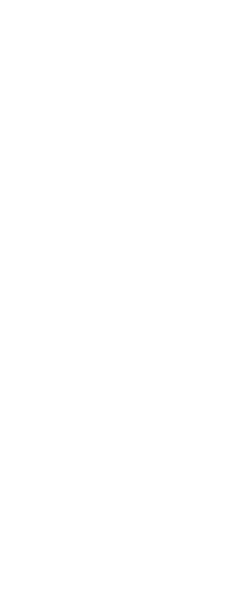

In [9]:
# Test run for one plot:

fig, axs = auscat_plots.plot_futures(
    time_selection="MJJASO",
    turbulence_index=turbulence_index,
    P=P,
    time_slices=[("2015", "2035"), ("2040", "2060"), ("2080", "2100")],
    experiment="ssp126",
    all_agree_except=1,
    save_fig=False,
    outfile=None,
    zonal_plots=True,
    ticks_max=0.02,
)

In [ ]:
# %%time
with Client(threads_per_worker=12, n_workers=1) as client:
    # for turbulence_index in ["VWS", "windspeed"]:
    #     for P in ["200", "250"]:
    combined_significance_table_file= (f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/evaluation_combined_tests_table_{turbulence_index}-{P}hPa.csv")
    if  os.path.exists(combined_significance_table_file):
        print(f"File '{combined_significance_table_file}' already exists.")
    else:
        combined_significance_table(turbulence_index, P,)
        print(f"Made '{combined_significance_table_file}'")


File '/scratch/v46/gt3409/TI1/250hPa/evaluation_combined_tests_table_TI1-250hPa.csv' already exists.


Saved /scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/Future_decades_TI1_250hPa_change_in_frequency_of_exceeding_p99_ssp126_MJJASO_baseline-plus-3timeslices.png


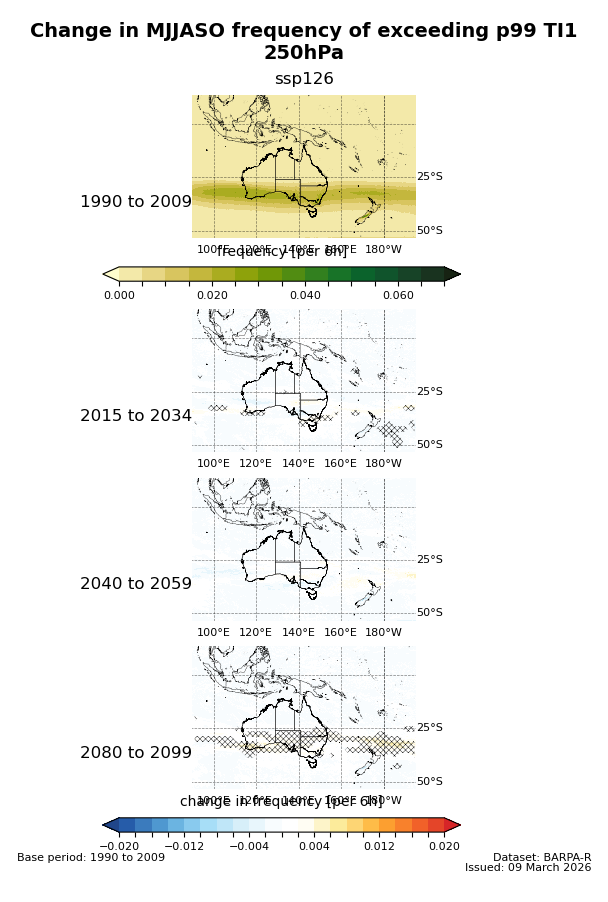

In [ ]:
# column structure

importlib.reload(auscat_plots)

outfile = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/Future_decades_{turbulence_index}_{P}hPa_change_in_frequency_of_exceeding_p99_{experiment}_{time_selection}_baseline-plus-3timeslices.png"
auscat_plots.plot_futures_1plus3(time_selection=time_selection, 
                                    turbulence_index=turbulence_index,
                                    P=P,
                                    time_slices=[("1990", "2009")] + time_slices,
                                    experiment=experiment, 
                                    all_agree_except=1, 
                                    save_fig=True,
                                    outfile = outfile,
                                    ticks_max=0.02)